In [1]:
#learn gung fu
import numpy as np
import pandas as pd
pd.options.display.max_columns = 61
pd.options.display.max_rows = 61
import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
import seaborn as sns
import mason_functions as mf
import explore
import wrangle
import scale 

from scipy import stats

# Wrangle

In [2]:
#load data
df = pd.read_csv('employee_attrition.xls')

#preview data
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2


In [3]:
#get dataframe info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

I want to explore differences in model performance from discrete features. I will make a list of out of the discrete variables. For items in this list, the item can be measured on a scale from 1 to 4 (except the education, that is on a scale of 1 to 5), or the item can be viewed as a category.

I want to get a feel for the data I am about to explore, and I would like to separate the data into numeric, categorical and discrete features. I will now loop through all of the columns to get a better feel as to what's available and what goes where.

In [4]:
#loop through columns to print number of unique values that each feature has
for col in df.columns:
    print(f'{col}: {df[col].nunique()}')
    print('---')

Age: 43
---
Attrition: 2
---
BusinessTravel: 3
---
DailyRate: 886
---
Department: 3
---
DistanceFromHome: 29
---
Education: 5
---
EducationField: 6
---
EmployeeCount: 1
---
EmployeeNumber: 1470
---
EnvironmentSatisfaction: 4
---
Gender: 2
---
HourlyRate: 71
---
JobInvolvement: 4
---
JobLevel: 5
---
JobRole: 9
---
JobSatisfaction: 4
---
MaritalStatus: 3
---
MonthlyIncome: 1349
---
MonthlyRate: 1427
---
NumCompaniesWorked: 10
---
Over18: 1
---
OverTime: 2
---
PercentSalaryHike: 15
---
PerformanceRating: 2
---
RelationshipSatisfaction: 4
---
StandardHours: 1
---
StockOptionLevel: 4
---
TotalWorkingYears: 40
---
TrainingTimesLastYear: 7
---
WorkLifeBalance: 4
---
YearsAtCompany: 37
---
YearsInCurrentRole: 19
---
YearsSinceLastPromotion: 16
---
YearsWithCurrManager: 18
---


In [5]:
#loop through columns, and print out values and counts for each feature
for col in df.columns:
    print(col)
    print('---')
    print(df[col].value_counts().sort_index(ascending = False))
    print('==============')
    print('              ')

Age
---
60     5
59    10
58    14
57     4
56    14
55    22
54    18
53    19
52    18
51    19
50    30
49    24
48    19
47    24
46    33
45    41
44    33
43    32
42    46
41    40
40    57
39    42
38    58
37    50
36    69
35    78
34    77
33    58
32    61
31    69
30    60
29    68
28    48
27    48
26    39
25    26
24    26
23    14
22    16
21    13
20    11
19     9
18     8
Name: Age, dtype: int64
              
Attrition
---
Yes     237
No     1233
Name: Attrition, dtype: int64
              
BusinessTravel
---
Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64
              
DailyRate
---
1499    1
1498    1
1496    2
1495    3
1492    1
       ..
106     1
105     1
104     1
103     1
102     1
Name: DailyRate, Length: 886, dtype: int64
              
Department
---
Sales                     446
Research & Development    961
Human Resources            63
Name: Department, dtype: int64
              
Dis

In [6]:
#set a list of categorical columns based on the columns above
categorical = ['attrition',
               'business_travel',
               'department',
               'education_field',
               'gender',
               'job_role',
               'marital_status',
               'overtime'
              ]

#set a list of discrete columns
discrete = ['education',
            'environment_satisfaction',
            'job_involvement',
            'job_level',
            'job_satisfaction',
            'performance_rating',
            'relationship_satisfaction', 
            'stock_option_level',
            'work_life_balance'
           ]

#set a list of numeric columns
numeric = ['age',
           'daily_rate',
           'distance_from_home',
           'education',
           'environment_satisfaction',
           'hourly_rate',
           'job_involvement',
           'job_level',
           'job_satisfaction',
           'monthly_income',
           'monthly_rate',
           'companies_worked',
           'percent_salary_hike',
           'performance_rating',
           'relationship_satisfaction',
           'stock_option_level',
           'total_working_years',
           'hours_trained_last_year',
           'work_life_balance',
           'company_years',
           'current_role_years',
           'years_since_last_promotion',
           'years_with_manager'
          ]

## Wrangle: Finished

In [7]:
#pull in datasets
df, train, validate, test = wrangle.prepare_attrition()

In [8]:
for cat in categorical:
    print(cat)
    print('---')
    print(df[cat].value_counts())
    print('==============')
    print('              ')

attrition
---
0    1233
1     237
Name: attrition, dtype: int64
              
business_travel
---
Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: business_travel, dtype: int64
              
department
---
Research & Development    961
Sales                     446
Human Resources            63
Name: department, dtype: int64
              
education_field
---
Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: education_field, dtype: int64
              
gender
---
Male      882
Female    588
Name: gender, dtype: int64
              
job_role
---
Sales Executive              326
Research Scientist           292
Laboratory Technician        259
Manufacturing Director       145
Healthcare Representative    131
Manager                      102
Sales Representative          83
Research Director             80
Human Resources               52
Name: job_role,

# Explore

### Initial Questions
I. What is the total percentage of attrition? What is attrition like across departments? Are any departments associated with attrition?

II. What is job satisfacton like for employees part ways with the company?

III. What is relationship satisfaction like for employees who depart?

IV. How does daily rate (daily income) compare for employees who leave vs those who do not?

V. How does average total working years compare across employees who leave vs those who don't?

VI. How do performance ratings compare between departed and retained employees?

VII. How does distance from home affect employee attrition?

In [9]:
#preview unsplit data
df.head()

,age,attrition,business_travel,daily_rate,department,distance_from_home,education,education_field,environment_satisfaction,gender,hourly_rate,job_involvement,job_level,job_role,job_satisfaction,marital_status,monthly_income,monthly_rate,companies_worked,overtime,percent_salary_hike,performance_rating,relationship_satisfaction,stock_option_level,total_working_years,hours_trained_last_year,work_life_balance,company_years,current_role_years,years_since_last_promotion,years_with_manager,travel_none,travel_frequently,travel_rarely,hr_dept,research_dev_dept,sales_dept,hr_ed,life_sciences_ed,marketing_ed,medical_ed,other_ed,tech_deg_ed,female,healthcare_rep_job,hr_job,lab_tech_job,manager_job,manufacturing_dir_job,research_dir_job,research_scientist_job,sales_exec_job,sales_rep_job,divorced,married,single
employee_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,41,1,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,1,11,3,1,0,8,0,1,6,4,0,5,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1
2,49,0,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,0,23,4,4,1,10,3,3,10,7,1,7,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
4,37,1,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,1,15,3,2,0,7,3,3,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1
5,33,0,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,1,11,3,3,0,8,3,3,8,7,3,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0
7,27,0,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,0,12,3,4,1,6,3,3,2,2,2,2,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0


In [10]:
#juxtapose subset shapes
train.shape, validate.shape, test.shape

((823, 56), (353, 56), (294, 56))

In [11]:
#preview train set
train.head()

,age,attrition,business_travel,daily_rate,department,distance_from_home,education,education_field,environment_satisfaction,gender,hourly_rate,job_involvement,job_level,job_role,job_satisfaction,marital_status,monthly_income,monthly_rate,companies_worked,overtime,percent_salary_hike,performance_rating,relationship_satisfaction,stock_option_level,total_working_years,hours_trained_last_year,work_life_balance,company_years,current_role_years,years_since_last_promotion,years_with_manager,travel_none,travel_frequently,travel_rarely,hr_dept,research_dev_dept,sales_dept,hr_ed,life_sciences_ed,marketing_ed,medical_ed,other_ed,tech_deg_ed,female,healthcare_rep_job,hr_job,lab_tech_job,manager_job,manufacturing_dir_job,research_dir_job,research_scientist_job,sales_exec_job,sales_rep_job,divorced,married,single
employee_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
791,52,0,Non-Travel,715,Research & Development,19,4,Medical,4,Male,41,3,1,Research Scientist,4,Married,4258,26589,0,0,18,3,1,1,5,3,3,4,3,1,2,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
505,55,0,Travel_Rarely,1311,Research & Development,2,3,Life Sciences,3,Female,97,3,4,Manager,4,Single,16659,23258,2,1,13,3,3,0,30,2,3,5,4,1,2,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1
900,37,0,Travel_Frequently,1231,Sales,21,2,Medical,3,Female,54,3,1,Sales Representative,4,Married,2973,21222,5,0,15,3,2,1,10,3,3,5,4,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0
1684,23,1,Travel_Rarely,1320,Research & Development,8,1,Medical,4,Male,93,2,1,Laboratory Technician,3,Single,3989,20586,1,1,11,3,1,0,5,2,3,5,4,1,2,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1
712,48,0,Travel_Rarely,817,Sales,2,1,Marketing,2,Male,56,4,2,Sales Executive,2,Married,8120,18597,3,0,12,3,4,0,12,3,3,2,2,2,2,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0


In [12]:
#recap on numeric columns
numeric

['age',
 'daily_rate',
 'distance_from_home',
 'education',
 'environment_satisfaction',
 'hourly_rate',
 'job_involvement',
 'job_level',
 'job_satisfaction',
 'monthly_income',
 'monthly_rate',
 'companies_worked',
 'percent_salary_hike',
 'performance_rating',
 'relationship_satisfaction',
 'stock_option_level',
 'total_working_years',
 'hours_trained_last_year',
 'work_life_balance',
 'company_years',
 'current_role_years',
 'years_since_last_promotion',
 'years_with_manager']

Education
* 1 'Below College'
* 2 'College'
* 3 'Bachelor'
* 4 'Master'
* 5 'Doctor'

EnvironmentSatisfaction, JobInvolvement, JobSatisfaction, RelationshipSatisfaction 
* 1 'Low'
* 2 'Medium'
* 3 'High'
* 4 'Very High'

PerformanceRating 
* 1 'Low'
* 2 'Good'
* 3 'Excellent'
* 4 'Outstanding'

 
WorkLifeBalance 
* 1 'Bad'
* 2 'Good'
* 3 'Better'
* 4 'Best'

Univariate Distributions


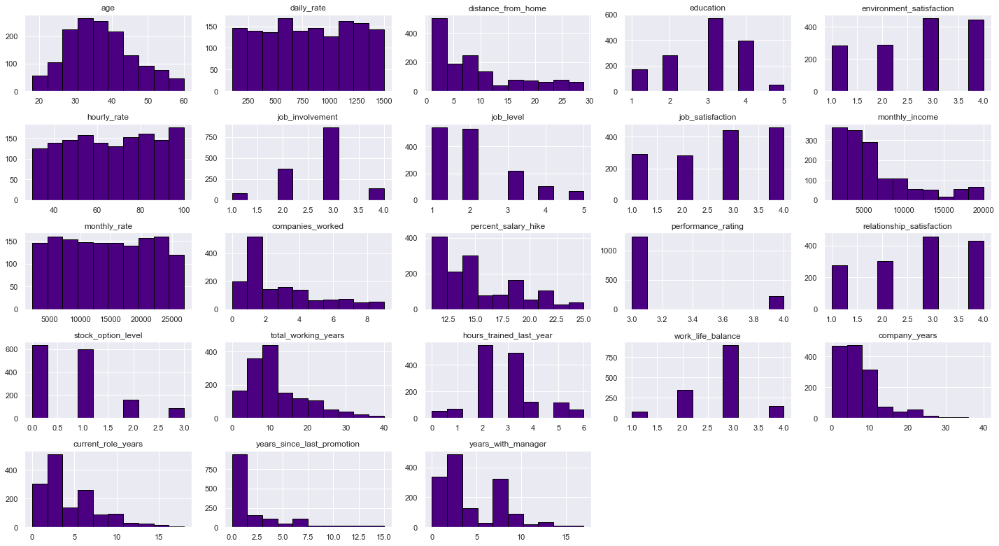

In [13]:
#loop through numeric features to view distributions
explore.distributions_grid(df, numeric)
print('Univariate Distributions')

### Distributions Takeaways
First row:
* age is normally distributed
* daily rate is pretty uniformly distributed
* most people work close to home
* most employees have a bachelor's degree (close to 600) and then more have a master's (approx 400) than those with a 'college' education (around 300) and then a few hundred have 'below college' for education, and then around 50 have a doctorate
* around 300 people have low satsifaction with the environment, around 300 have medium satisfaction-- but around 500 people have high satisfaction and around 500 people have very high satisfaction with the environment

Second row:
* hourly rate seems uniformally distributed, with slight majority of employees (just shy of 200) having an hourly rate of 100
* Most employees are highly involved with their job
* Most employees are 1st and 2nd level jobs and around 200 employees have a third level job
* Around 300 employees each have low or medium satisfaction, but most people (around 500 each) have high or very high satisfaction
* majority of monthly incomes are 5000 or below


Third row:
* no surprise, monthly rate is also pretty uniformly distributed
* majority of employees have worked at one company, otherwise pretty uniformly distributed from 0-9
* salary hike percentage is skewed to the right, with most employees having relatively low percentage hike in salary
* most employees have performances rated at 'excellent,' but there are around 200 or so with a performance rating of 'outstanding.'
* around 500 or so each have high or very high satisfaction with their relationship, around 300 each have low and medium satisfaction


Fourth row:
* majority of employees own 0 or few stocks from company
* total working years hist is skewed to the right, with majority of employees having 5-10 years of work under their belt (xticks end at 40 for this chart)
* majority of employees trained 2-3 hours last year
* majority of employees rate their work life balance as 'better' (over 800) and around 400 rate it as 'good'
* majority of employees have been with the company for 10 or less years

Fifth row:
* majority of employees have 2-3 years in their current role, chart is heavily skewed to the right
* majority of employees have 0 years since their last promotion, chart is heavily skewed to the right (otherwise uniformly distributed aside from employees with 0-1 years since last promo)
* majority of employees have 2 years with the current manager, and those with 7 years and 0 have similar groupsizes, other than that the chart is pretty randomly distributed 

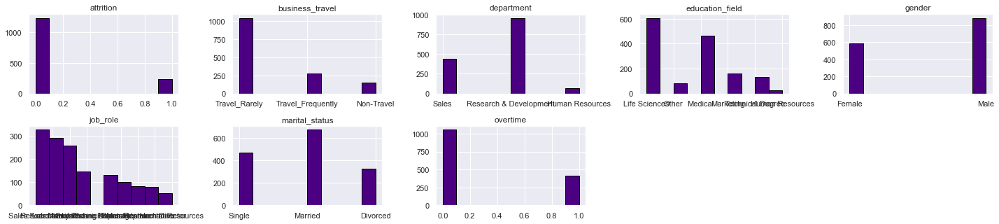

In [14]:
#explore distributions of categorical features
explore.distributions_grid(df, categorical)

### Takeaways
* most employees stay with the company
* most employees travel rarely
* most employees work in R&D
* majority of employees are male
* slight majority of employees are married, a good proportion of employees are single and then a good proportion are divorced
* around 400 employees get overtime, majority do not

#### Is attrition associated with overtime?  Is there a dependency that exists between attrition and any of these categories?
Will explore these questions later

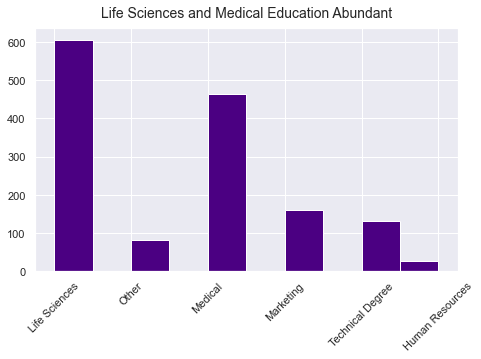

In [15]:
#create larger figure for clarity
plt.figure(figsize = (7, 4))

#induce histogram
df.education_field.hist(color = 'indigo')

#clear it up
plt.tight_layout()

#rotate x-axis ticks 45 degrees, increase size for readability
plt.xticks(rotation = 45, size = 11)

#increase y-axis tick size for readability
plt.yticks(size = 11)

#title
plt.title('Life Sciences and Medical Education Abundant', size = 14, pad = 11);

* majority of employees have an education in life sciences or in the medical field

In [16]:
def distribution(df, feature):
    
    plt.figure(figsize = (7, 4))    # create figure
    
    df[feature].hist(color = 'indigo')    # plot histogram of feature
    
    plt.tight_layout()    # clear it up
    
    plt.xticks(rotation = 45, size = 11)    # rotate x-axis label ticks 45 degrees, increase size to 11
    
    plt.yticks(size = 13)    # increase y-axis label ticks to size 13
    
    f_feature = feature.replace('_', ' ').capitalize()    # re-format string for title
    
    plt.title(f'Distribution of {f_feature}', size = 13)    # title
    
    plt.ylabel('Frequency', size = 11)    # y-axis label

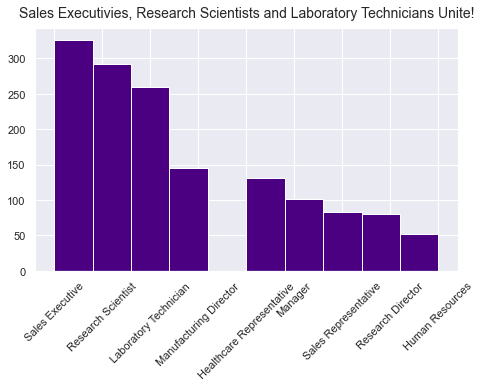

In [17]:
#create larger figure for clarity
plt.figure(figsize = (7, 4))

#induce histogram
df.job_role.hist(color = 'indigo')

#clear it up
plt.tight_layout()

#rotate x-axis ticks 45 degrees, increase size for readability
plt.xticks(rotation = 45, size = 11)

#increase y-axis tick size for readability
plt.yticks(size = 11)

#title
plt.title('Sales Executivies, Research Scientists and Laboratory Technicians Unite!', size = 14, pad = 11);

* The majority of jobs are held by sales executives, research scientists, laboratory technicians

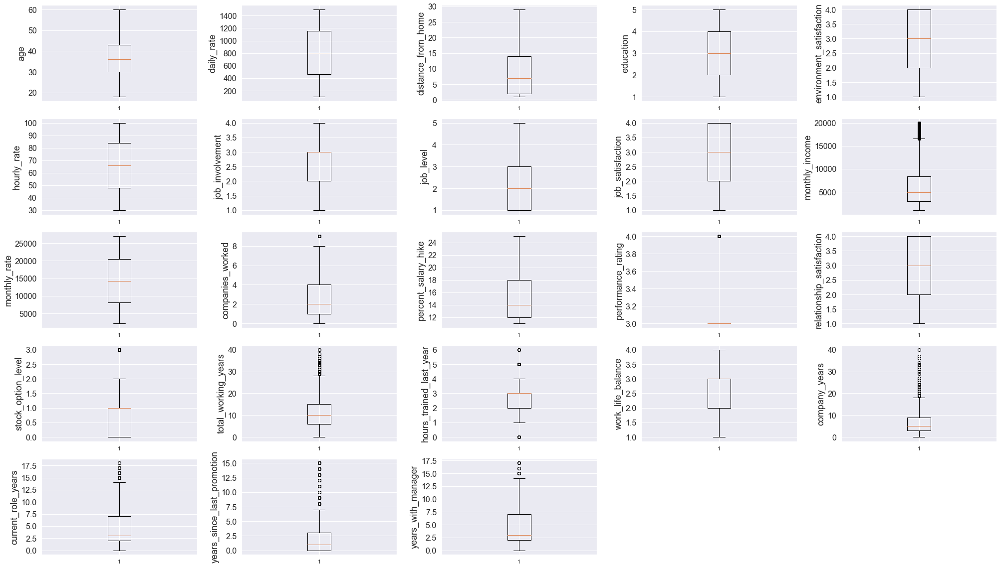

In [18]:
#view boxplot distributions
explore.boxplot_grid(df, numeric)

### Takeaways
* boxplot distributions supplement my knowledge of feature distributions with medians and IQRs, and it looks like I have outliers in the data

Outliers present in:
* monthly income (lots of outliers here)
* number of companies worked at
* performance rating
* total working years
* years at the company
* years in current role
* years since last promotion
* years with current manager

I will leave the outliers be for now. There aren't very many outliers pressent except for in the monthly income distribution (ok there are lots of outliers), and I would like to include all data in my first models. I will use a robust scaler with high hopes.

Let's look at pairwise relationships-- specifically, relationships between continuous variables, and let's hue in the target variable to see if we can glean any insights.

In [19]:
#add target variable to continuous columns to hue in pairplot
numeric.append('attrition')

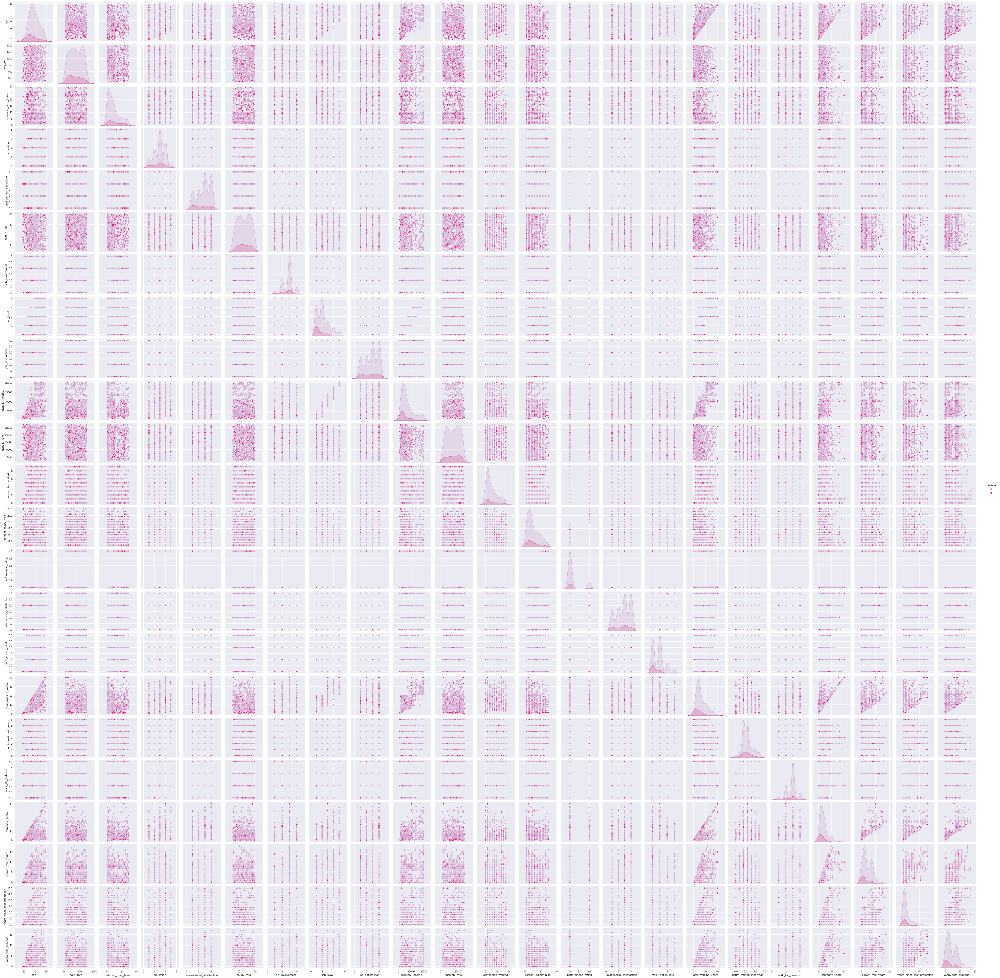

In [20]:
#run pairplot, hue target variable
sns.pairplot(train[numeric], hue = 'attrition', palette = 'PuRd');

### Takeaways
* It seems the farther from home, the more likely for employee attrition to occur
* Employees with lower percent salary hikes seem to depart the company more (iffy)
* Seems like employees with more years since their last promotion depart the company more
* Seems like the less involved an employee is with their job, the more likely attrition is to come swinging around
* Similar observation with job level (the lower the job level etc.)
* The lower the monthly income, the higher the chance of attrition
* May be a relationship between stocks owned and attrition (the lower the stock option level, the higher chance of attrition it seems)
* The less time spent with the company, the higher the chance of attrition

Doesn't seem to affect attrition:
* age doesn't seem to affect attrition
* daily rate (pay) doesn't seem to affect attrition
* education doesn't seem to affect attrition
* neither does employee satisfaction with the environment
* hourly rate
* job satisfaction
* ironically, monthly rate doesn't seem to affect attrition, but monthly income does? hmm. There are many outliers in monthly income, but not for monthly rate. Perhaps that has something to do with it.
* companies worked
* performance rating
* relationship satisfaction iffy
* total working years
* hours trained in the previous year
* work life balance
* number of years an employee has been with the company
* years with manager

Not many correlations here.
Features to consider further linear correlations:
* age, job_involvement, job_level, job_satisfaction, monthly_income, monthly_rate, total_working_years, hours_trained_last_year, work_life_balance, hours_trained_last_year, company_years, current_role_years, years_since_last_promotion, years with manager

### Further questions:
* 1) Do departed employees have on average lower percent salary hikes?
* 2) Do departed employees have on average more years since their last promotion?
* 3) Are departed employees less involved with their job?
* 4) Do departed employees have lower job levels?
* 5) Do departed employees have lower monthly income on average?
* 6) Do departed employees generally own less stocks with the company?

Let's look at pearson's correlation test results for all the pairs between continuous variables to get a better feel for the data.

In [21]:
#check length of continuous variable list
len(numeric)

24

In [22]:
#remove target variable from list, confirm length is less one
numeric.remove('attrition')
len(numeric)

23

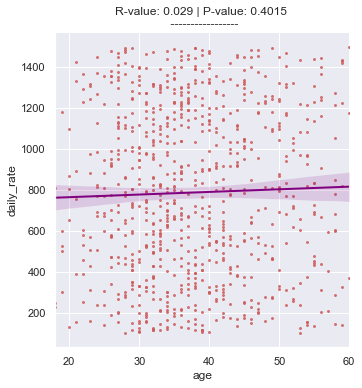

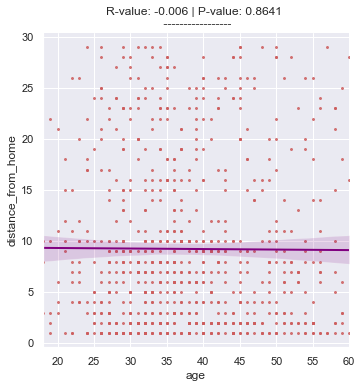

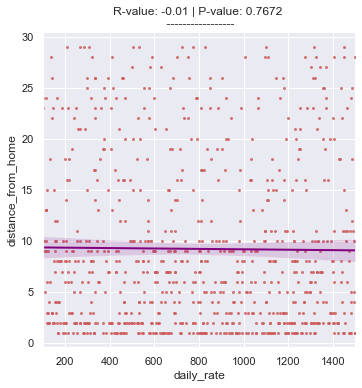

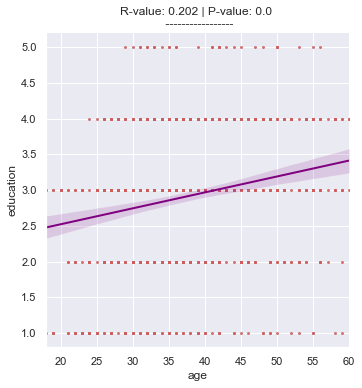

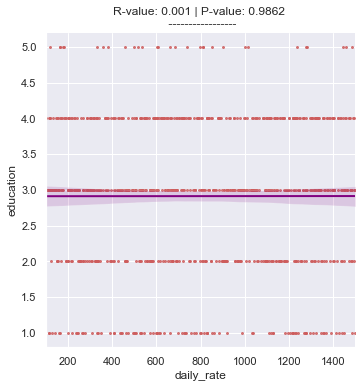

...

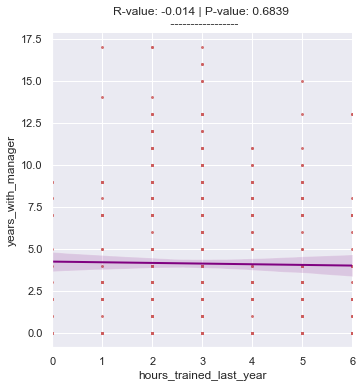

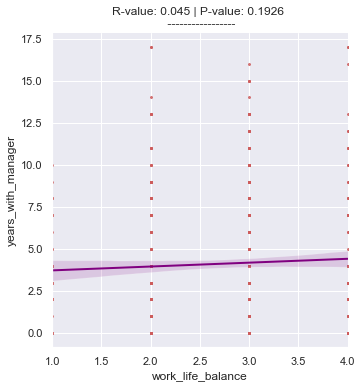

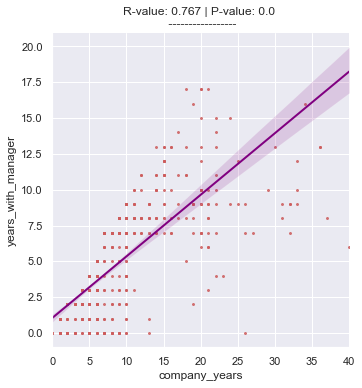

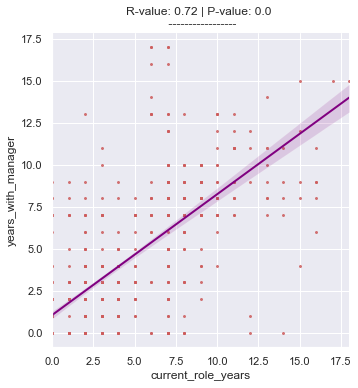

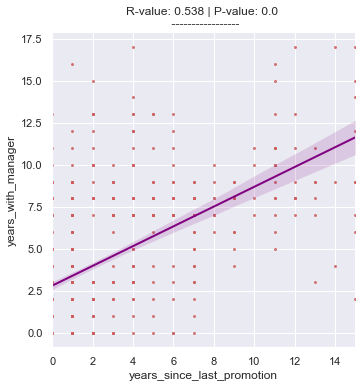

In [23]:
#explore linear relationships between continuous variables
explore.plot_variable_pairs(train, numeric)

### Takeaways
Small correlations:
* small correlation between education level and age (0.202)
* tiny negative correlation between hourly rate and environment satisfaction (-0.087)
* tiny correlation between job level and education level (0.087)
* tiny correlation between job level and environment satisfaction (.079)
* tiny negative correlation between job level and hourly rate (-0.072)?
* tiny negative correlation between job satisfaction and hourly rate (-0.091)
* tiny correlation between monthly income and education level (0.084)
* slight correlation between number of companies worked at and education level (0.122)
* slight correlation between number of companies worked at and job level (0.132)
* slight correlation between number of companies worked at and monthly income (0.143)
* slight correlation between total working years and education level (0.152)
* small correlation between total working years and number of companies worked at (0.24)
* tiny correlation between years at the company and education level (0.082)
* slight negative correlation between years at the company and number of companies worked at (-0.137)
* tiny negative correlation between years in current role and number of companies worked at (-0.092)
* small correlation between years in current role and age (0.195)
* tiny correlation between years in current role and number of stocks owned (0.084)
* tiny correlation between years in current role and work/ life balance (0.078)
* small correlation between years since last promotion and age (0.213)
* slight correlation between years with current manager and age (0.189)
* slight negative correlation between years with manager and number of companies worked at (-0.12)

Medium correlations:
* correlation between job level and age (0.492)
* correlation between monthly income and age (0.487)
* correlation between number of companies worked at and age (0.325)
* correlation between number of years at the company and age (0.294)
* correlation between years at the company and job level (0.532)
* correlation between years at the company and monthly income (0.515)
* correlation between years at the company and total working years-- duh (0.631)
* correlation between years in current role and job level (0.384)
* correlation between years in current role and monthly income (0.359)
* correlation between years in current role and total working years (0.457)
* correlation between years since last promotion and job level (0.338)
* correlation between years since last promotion and monthly income (0.334)
* correlation between years since last promotion and total working years (0.4)
* correlation between years since last promotion and company years (0.617)
* correlation between years since last promotion and years in current role (0.561)
* correlation between years with current manager and job level (0.381)
* correlation between years with manager and monthly income (0.34)
* correlation between years with manager and total working years (0.463)
* correlation between years with manager and years since last promotion (0.538)

#### Strong correlations:
* strong correlation between years in current role and years at the company (0.752)
* strong correlation between years with manager and company years (0.767)
* strong correlation between years with manager and years in current role (0.72)
* strong correlation between monthly income and job level (.955)
* strong correlation between performance rating and percent salary hike (0.768)
* strong correlation between total working years and age (0.655)
* strong correlation between total working years and job level (0.789)
* strong correlation between total working years and monthly income (0.78)

### Explore Q I
I. What is the total percentage of attrition? What is attrition like across departments? Are any departments associated with attrition?

In [24]:
#use pythonic len function to measure the lengths of dataframe subsets to determine ratios of attrition
#round for clarity
print(f'Total count of employees departed: {len(df[df.attrition == 1])} / Total count of employees retained: {len(df[df.attrition == 0])}')
print(f'Total attrition is {round((len(df[df.attrition == 1]) / len(df)) * 100)}%')
print(f'Attrition in the train data set is {round((len(train[train.attrition == 1]) / len(train)) * 100)}%')

Total count of employees departed: 237 / Total count of employees retained: 1233
Total attrition is 16%
Attrition in the train data set is 16%


Sklearn stratified my split correctly.

In [25]:
#assign variables to respective department data
research_and_dev = train[train.department == 'Research & Development']
sales = train[train.department == 'Sales']
human_resources = train[train.department == 'Human Resources']

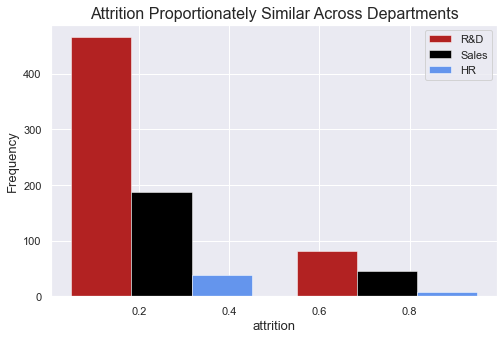

In [26]:
#compare attrition counts across departments
explore.juxtapose_target(research_and_dev, sales, human_resources, 'attrition')

### Takeaway
* attrition seems similarly proportioned throughout the departments

In [27]:
#print variable attrition percentages 
#(the .mean() of a column filled with 1s for yes and 0s for no gives the ratio of yes's divided by the length of column)
print(f'Research & Development attrition rate: {round(research_and_dev.attrition.mean() * 100)}%')
print(f'Sales attrition rate: {round(sales.attrition.mean() * 100)}%')
print(f'Human Resources attrition rate: {round(human_resources.attrition.mean() * 100)}%')

Research & Development attrition rate: 15%
Sales attrition rate: 19%
Human Resources attrition rate: 16%


The Sales department has the highest attrition rate, and it is higher than the overall rate. 

In [28]:
def compare_attrition_rates(df, x):
    sns.barplot(x = x, y = 'attrition', data = df)    # compare attrition rates across category x
    plt.axhline(df.attrition.mean(), label = 'Overall Attrition Rate')    # show overall attrition rate
    plt.legend()    # label horizontal plot line
    plt.grid(False)    # good-bye, gridlines

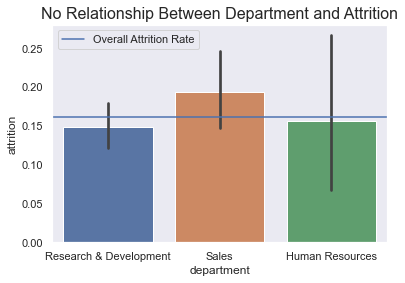

In [29]:
compare_attrition_rates(train, 'department')
plt.title('No Relationship Between Department and Attrition', size = 16);

#### Is there a relationship between the Sales department and attrition?
Let's run a chi squared test.

#### Null hypothesis:  Working in the Sales department and attrition are independent of each other.
#### Alternate hypothesis: Working in the Sales department and attrition are associated.

In [30]:
#form a contingency table between attrition and the sales department
observed = pd.crosstab(train.attrition, train.sales_dept)
observed

sales_dept,0,1
attrition,,
0,503,187
1,88,45


In [31]:
#run chi squared test
explore.return_chi2(observed)

Observed
--------
[[503 187]
 [ 88  45]]
Expected
--------
[[495 194]
 [ 95  37]]
Degrees of Freedom: 1
Chi^2 and P
-----------
chi^2 = 2.1757
p = 0.1402


#### The high p-value indicates that I fail to reject my null hypothesis that working in the Sales department and attrition are independent of each other.

### Q I Takeaway
* Attrition is not associated with any department.

### Explore Q II
II. What is job satisfacton like for employees part ways with the company?

In [32]:
#assign variables to respective data
departed = train[train.attrition == 1]
retained = train[train.attrition == 0]

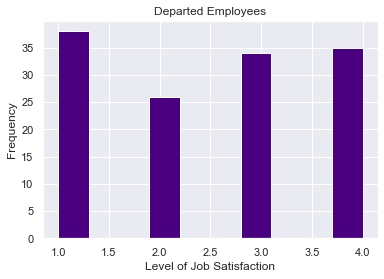

In [33]:
#plot histogram of job satisfaction levels for the departed
departed.job_satisfaction.hist(color = 'indigo')
plt.title('Departed Employees')
plt.xlabel('Level of Job Satisfaction')
plt.ylabel('Frequency');

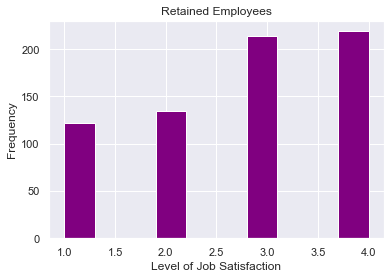

In [34]:
#plot histogram of job satisfaction levels for retained employees
retained.job_satisfaction.hist(color = 'purple')
plt.title('Retained Employees')
plt.xlabel('Level of Job Satisfaction')
plt.ylabel('Frequency');

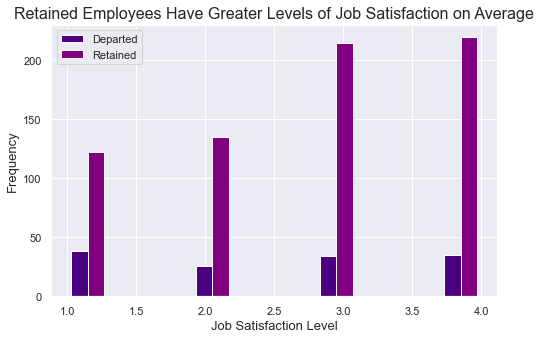

In [35]:
plt.figure(figsize = (8, 5))

plt.hist([departed.job_satisfaction, retained.job_satisfaction],
        label = ['Departed', 'Retained'],
        color = ['indigo', 'purple']
        )
plt.legend()
plt.title('Retained Employees Have Greater Levels of Job Satisfaction on Average', size = 16, pad = 6)
plt.xlabel('Job Satisfaction Level', size = 13)
plt.ylabel('Frequency', size = 13);

It's not crystal clear, but it seems like employees who stay with the company have greater job satisfaction levels on average. Let's run some tests.

#### Assumptions for T-Test:

* X Normality - an abdunance of observations means this assumption is met (central limit theorem).
* X Independent observations - one employee's level of satisfaction with her/ his job is not dependent on another employee's satisfaction with her/ his job.
* Equal variances - will test for equal variances

In [36]:
#variances at a glance
departed.job_satisfaction.var(), retained.job_satisfaction.var()

(1.3579403053087271, 1.1682127006163137)

Variances at a glance seem the same, but the scale is 1-4, so just to be sure, I'm gonna run a Levene's test.

In [37]:
#test for homoscedasticity
stat, p = stats.levene(departed.job_satisfaction, retained.job_satisfaction)
stat, p

(6.1790664218469225, 0.01312499059217485)

Low p-value suggests these variances are different. Let's run the test.

#### Null hypothesis: Departed employees have the same or more job satisfaction on average than retained employees.
#### Alternate hypothesis: Departed employees have less job satisfaction than retained employees.

In [38]:
#compute t-statistic, p-value from t-test, set equal variances parameter to False
t_stat, p = stats.ttest_ind(departed.job_satisfaction,
                            retained.job_satisfaction,
                            equal_var = False,
                            alternative = 'less'
                           )
t_stat, p

(-2.4919484785109973, 0.006808295190686519)

#### With a low p-value and a negative t-statistic, I can confidently reject the null hypothesis that departed employees have the same or more job satisfaction than employees retained.

### Q II Takeaway
* departed employees have significantly less job satisfaction than retained employees

### Explore Q III
What is relationship satisfaction like for employees who depart?

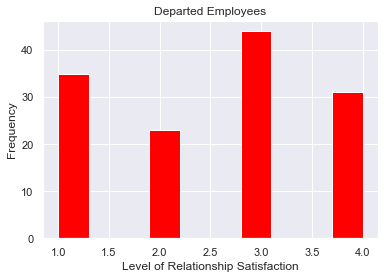

In [39]:
#plot histogram of relationship satisfaction level of departed employees
departed.relationship_satisfaction.hist(color = 'red')
plt.title('Departed Employees')
plt.xlabel('Level of Relationship Satisfaction')
plt.ylabel('Frequency');

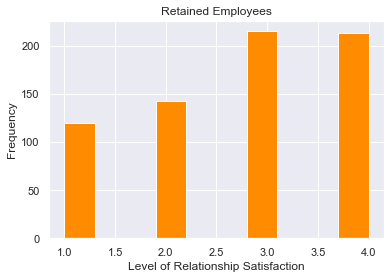

In [40]:
#plot histogram of relationship satisfaction level of retained employees
retained.relationship_satisfaction.hist(color = 'darkorange')
plt.title('Retained Employees')
plt.xlabel('Level of Relationship Satisfaction')
plt.ylabel('Frequency');

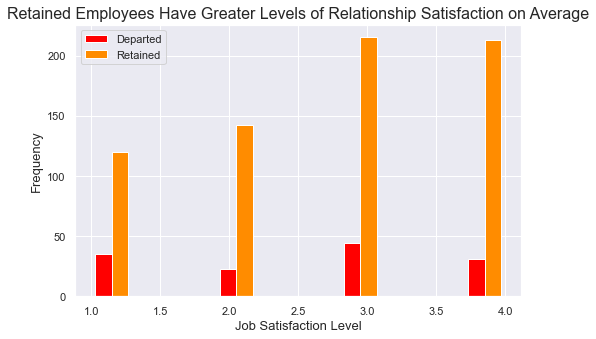

In [41]:
#create figure
plt.figure(figsize = (8, 5))

#plot distributions side by side
plt.hist([departed.relationship_satisfaction, retained.relationship_satisfaction],
        label = ['Departed', 'Retained'],
        color = ['red', 'darkorange']
        )

#include legend
plt.legend()

#title
plt.title('Retained Employees Have Greater Levels of Relationship Satisfaction on Average', size = 16, pad = 6)

#x-axis label
plt.xlabel('Job Satisfaction Level', size = 13)

#y-axis label
plt.ylabel('Frequency', size = 13);

In [42]:
#compare means
departed.relationship_satisfaction.mean(), retained.relationship_satisfaction.mean()

(2.5338345864661656, 2.755072463768116)

Average relationship satisfaction for retained employees seems marginally higher. Let's run some tests to be sure.

Assumptions for T-Test:

* X Normality - an abdunance of observations means this assumption is met (central limit theorem).
* X Independent observations - one employee's level of satisfaction with her/ his partner is not dependent on another employee's satisfaction with her/ his partner. I hope.
* Equal variances - will test for equal variances

In [43]:
#variances at a glance
departed.relationship_satisfaction.var(), retained.relationship_satisfaction.var()

(1.2507404875825923, 1.1518247407500843)

Ok these variances look the same. Let's be sure.

In [44]:
#run levene's to test for homoscedasticity
stat, p = stats.levene(departed.relationship_satisfaction, retained.relationship_satisfaction)
stat, p

(1.1209623862163183, 0.2900227187497005)

High p-value suggests these variances are the same.

#### Are departed employees relationship satisfaction levels significantly less than retained employees'?

#### Null hypothesis: Relationship satisfaction levels for departed employees are the same as retained employees' levels.

#### Alternate hypothesis: Relationship satisfaction levels for departed employees are less than retained employees'.

In [45]:
#run t-test
t_stat, p = stats.ttest_ind(departed.relationship_satisfaction,
                            retained.relationship_satisfaction,
                            alternative = 'less')
t_stat, p

(-2.1619169953315707, 0.015456431389942916)

#### The low p-value and negative t-statistic gives me the confidence to reject the null hypothesis that the relationship satisfaction levels between the two populations are the same. 

### Q III Takeaway
* departed employees reported significantly less relationship satisfaction than retained employees

### Explore Q IV
How does daily rate (daily income) compare for employees who leave vs those who do not?

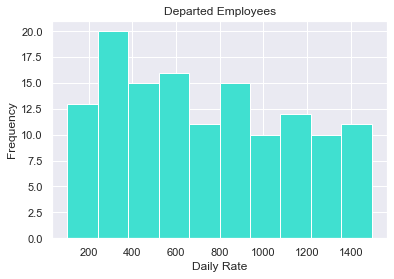

In [46]:
#plot histogram of daily rates for departed employees
departed.daily_rate.hist(color = 'turquoise')
plt.title('Departed Employees')
plt.xlabel('Daily Rate')
plt.ylabel('Frequency');

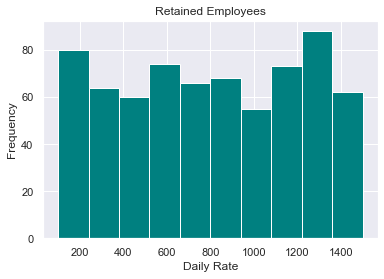

In [47]:
#plot histogram of daily rates for retained employees
retained.daily_rate.hist(color = 'teal')
plt.title('Retained Employees')
plt.xlabel('Daily Rate')
plt.ylabel('Frequency');

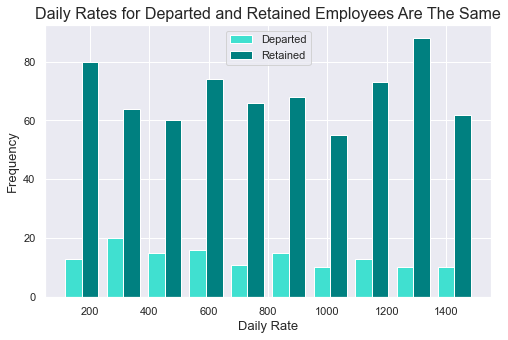

In [48]:
#create figure
plt.figure(figsize = (8, 5))

#plot distributions side by side
plt.hist([departed.daily_rate, retained.daily_rate],
        label = ['Departed', 'Retained'],
        color = ['turquoise', 'teal']
        )

#include legend
plt.legend()

#title
plt.title('Daily Rates for Departed and Retained Employees Are The Same', size = 16, pad = 6)

#x-axis label
plt.xlabel('Daily Rate', size = 13)

#y-axis label
plt.ylabel('Frequency', size = 13);

It's not clear to me if there is a signifcant difference. Averages look about the same.

#### Is there a difference in daily rate for departed employees vs retained employees?

#### Null hypothesis: Daily rates for departed and retained employees are the same.
#### Alternate hypothesis: Daily rates for departed and retained employees are different.

Assumptions for T-Test:
* X Normality - an abdunance of observations means this assumption is met (central limit theorem).
* X Independent observations - daily rates for departed employees are independent of daily rates for retained employees.
* Equal variances - will test for equal variances

In [49]:
#juxtapose variances
departed.daily_rate.var(), retained.daily_rate.var()

(156504.97482342215, 168887.16951894158)

Variances between the two populations seem different. Let's confirm.

In [50]:
#test for homoscedasticity
stat, p = stats.levene(departed.daily_rate, retained.daily_rate)
stat, p

(0.7925620918075574, 0.37358732556362406)

High p-value suggests these variances are actually the same.

In [51]:
#run t-test
t_stat, p = stats.ttest_ind(departed.daily_rate, retained.daily_rate)
t_stat, p

(-1.5878174927962494, 0.11271263572745824)

####  The high p-value rejects my ability to reject the null hypothesis that daily rates are different.

### Q IV Takeaway
* daily rates for departed and retained employees on average are the same

### Explore Q V
How does average total working years compare across employees who leave vs those who don't?

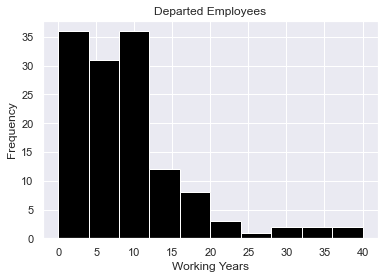

In [52]:
#plot histogram of total working years for departed employees
departed.total_working_years.hist(color = 'black')
plt.title('Departed Employees')
plt.xlabel('Working Years')
plt.ylabel('Frequency');

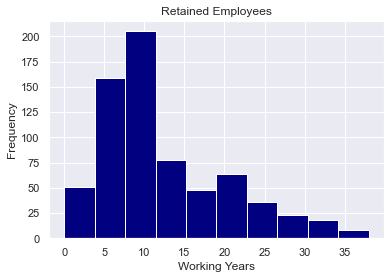

In [53]:
#plot histogram of total working years for retained employees
retained.total_working_years.hist(color = 'navy')
plt.title('Retained Employees')
plt.xlabel('Working Years')
plt.ylabel('Frequency');

Looks about the same to me. I'm still not sure.

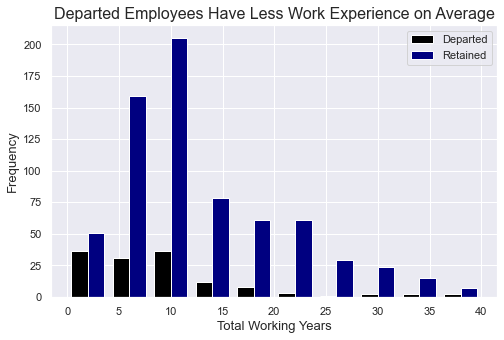

In [54]:
#create figure
plt.figure(figsize = (8, 5))

#plot distributions side by side
plt.hist([departed.total_working_years, retained.total_working_years],
        label = ['Departed', 'Retained'],
        color = ['black', 'navy']
        )

#include legend
plt.legend()

#title
plt.title('Departed Employees Have Less Work Experience on Average', size = 16, pad = 6)

#x-axis label
plt.xlabel('Total Working Years', size = 13)

#y-axis label
plt.ylabel('Frequency', size = 13);

Okay, now it definitely looks different. Looks like departed employees on average have less experience under their belts.

#### Is there a difference in total working years for departed employees vs retained employees?

#### Null hypothesis: Total working years for departed and retained employees are the same.
#### Alternate hypothesis: Total working years s for departed and retained employees are different.

Assumptions for T-Test:
* X Normality - an abdunance of observations means this assumption is met (central limit theorem).
* X Independent observations - total working years for departed employees are independent of total working years for retained employees.
* Equal variances - will test for equal variances

In [55]:
#compare variances
departed.total_working_years.var(), retained.total_working_years.var()

(60.422533606744125, 63.62495740518687)

Looks the same. Test.

In [56]:
#run levene's
stat, p = stats.levene(departed.total_working_years, retained.total_working_years)
stat, p

(1.1263171458247165, 0.28887435501293185)

High p-value confirms homoscedasticity.

In [57]:
#run t-test
t_stat, p = stats.ttest_ind(departed.total_working_years, retained.total_working_years)
t_stat, p

(-4.778416557668946, 2.0928796561426787e-06)

#### The low p-value allows me to reject the null hypothesis that total working years for departed and retained employees are the same.

### Q V Takeaway
* Total working years for departed and retained employees are different. Total working years for departed employees are less on average.

### Explore Q VI
How do performance ratings compare between departed and retained employees?

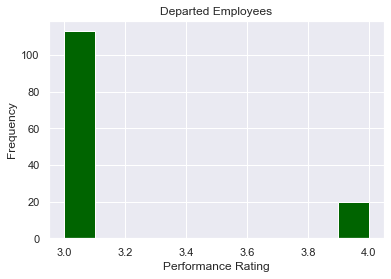

In [58]:
#plot histogram of performance ratings for departed employees
departed.performance_rating.hist(color = 'darkgreen')
plt.title('Departed Employees')
plt.xlabel('Performance Rating')
plt.ylabel('Frequency');

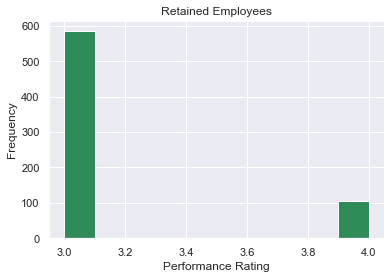

In [59]:
#plot histogram of performance ratings for retained employees
retained.performance_rating.hist(color = 'seagreen')
plt.title('Retained Employees')
plt.xlabel('Performance Rating')
plt.ylabel('Frequency');

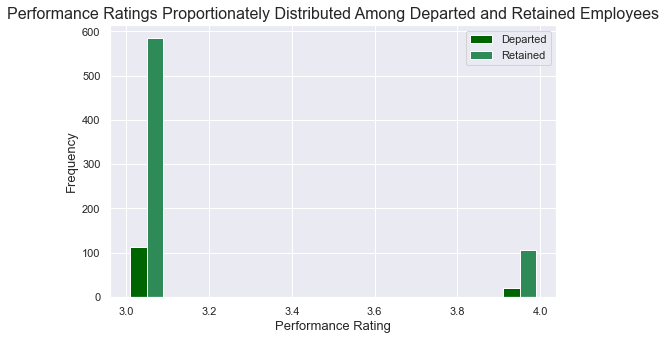

In [60]:
#create figure
plt.figure(figsize = (8, 5))

#plot distributions side by side
plt.hist([departed.performance_rating, retained.performance_rating],
        label = ['Departed', 'Retained'],
        color = ['darkgreen', 'seagreen']
        )

#include legend
plt.legend()

#title
plt.title('Performance Ratings Proportionately Distributed Among Departed and Retained Employees',
          size = 16,
          pad = 6
         )

#x-axis label
plt.xlabel('Performance Rating', size = 13)

#y-axis label
plt.ylabel('Frequency', size = 13);

Looks proportionally the same to me. There are 4 levels of performance rating-- all employees are rated excellent (3) or outstanding (4). Let's run some tests to see if we can glean any insights.

Assumptions for T-Test:
* X Normality - an abdunance of observations means this assumption is met (central limit theorem).
* X Independent observations - performance ratings for departed employees are independent of performance ratings for retained employees.
* Equal variances - will test for equal variances

In [61]:
#compare variances
departed.performance_rating.var(), retained.performance_rating.var()

(0.12873091820460258, 0.1292042657916338)

These variances definitely seem the same. Let's run a t-test and see what happens.

#### Null hypothesis: Performance ratings between departed and retained employees are-- on average--  the same.
#### Alternate hypothesis: Performance ratings between departed and retained employees are different on average.

In [62]:
#run t-test
t_stat, p = stats.ttest_ind(departed.performance_rating, retained.performance_rating)
t_stat, p

(-0.05283517831150403, 0.9578760852084698)

#### High p-value indicates I have failed to reject the null hypothesis that average performance ratings differ between departed and retained employees.

### Q VI Takeaway
* There is no significant difference in performance between departed and retained employees.

### Explore Q VII
How does distance from home affect employee attrition?

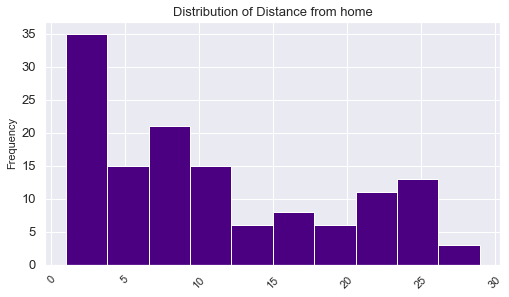

In [63]:
distribution(departed, 'distance_from_home')

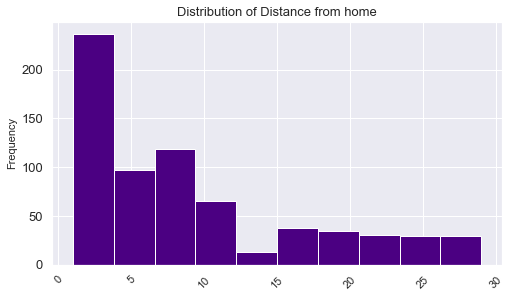

In [64]:
distribution(retained, 'distance_from_home')

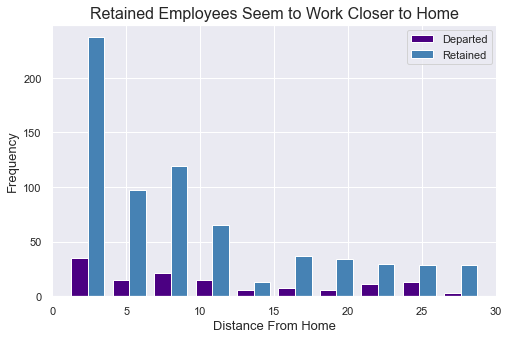

In [65]:
#create figure
plt.figure(figsize = (8, 5))

#plot distributions side by side
plt.hist([departed.distance_from_home, retained.distance_from_home],
        label = ['Departed', 'Retained'],
        color = ['indigo', 'steelblue']
        )

#include legend
plt.legend()

#title
plt.title('Retained Employees Seem to Work Closer to Home', size = 16, pad = 6)

#x-axis label
plt.xlabel('Distance From Home', size = 13)

#y-axis label
plt.ylabel('Frequency', size = 13);

These look almost look about the same, but it looks like retained employees work closer to home. Let's go ahead and run some tests to see if they are different.

Assumptions for T-Test:
* X Normality - an abdunance of observations means this assumption is met (central limit theorem).
* X Independent observations - distance from home for one employee is independent of distance from home for another.
* Equal variances - will test for equal variances

In [66]:
#compare variances between samples
departed.distance_from_home.var(), retained.distance_from_home.var()

(68.91660970608335, 63.13877495214684)

Variances are similar but could be different. Let's run a levene's test.

In [67]:
#test for homoscedasticity
stat, p = stats.levene(departed.distance_from_home, retained.distance_from_home)
stat, p

(2.183268285296717, 0.13990140485475544)

High p-value indicates the variances are indeed similar enough. Let's run the test.

#### Do retained employees work closer to home on average?

#### Null hypothesis: Retained employees work the same or a greater distance from home than departed employees.
#### Alternate hypothesis: Retained employees work closer to home on average.

In [68]:
#run t-test to compare means
t_stat, p = stats.ttest_ind(retained.distance_from_home, departed.distance_from_home, alternative = 'less')
t_stat, p

(-2.545295649699346, 0.0055501898620584226)

#### With a negative t-statistic and a low p-value, I can confidently reject the null hypothesis that retained employees work the same or a greater distance from home than departed employees.

### Q VII Takeaway
* Retained employees work closer to home on average than departed employees.

## Further Exploration
1. Do departed employees have on average lower percent salary hikes?
2. Do departed employees have on average more years since their last promotion?
3. Are departed employees less involved with their job than retained employees?
4. Do departed employees have lower job levels than those of retained employees?
5. Do departed employees have lower monthly income on average?
6. Do departed employees generally own less stocks with the company?
7. Is attrition associated with any level of travel?
8. Is attrition associated with any education field?
9. Is there a relationship between gender and attrition?
10. Is there any job where attrition occurs the most?
11. Are marital status and attrition independent of each other?
12. Is attrition related to whether or not an employee has overtime?

### FE Q I
Do departed employees have on average lower percent salary hikes?

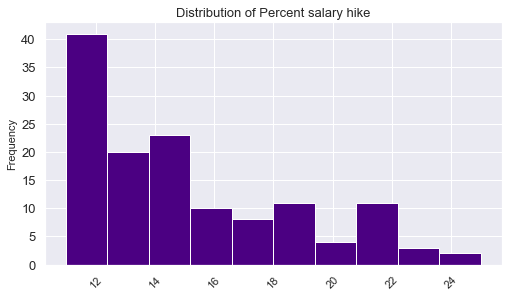

In [69]:
distribution(departed, 'percent_salary_hike')

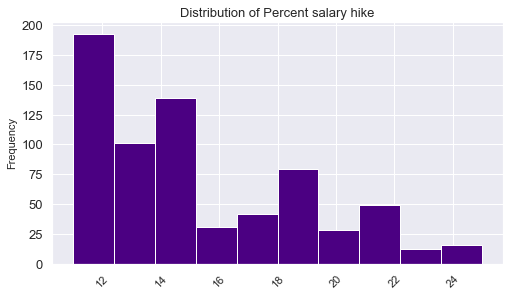

In [70]:
distribution(retained, 'percent_salary_hike')

### Takeaway
These distributions look eerily similar. I'm pretty confident that there is no significant difference here. Moving on.

### FE Q II
Do departed employees have on average more years since their last promotion?

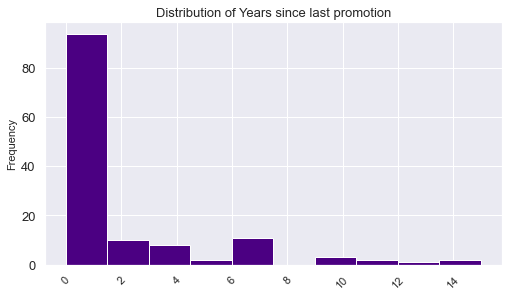

In [71]:
distribution(departed, 'years_since_last_promotion')

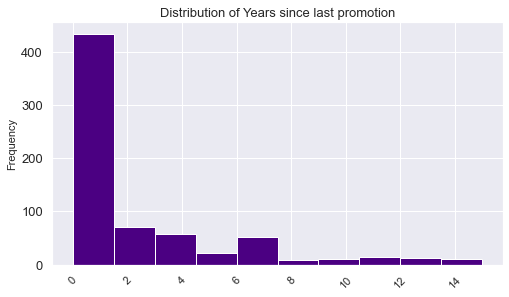

In [72]:
distribution(retained, 'years_since_last_promotion')

### Takeaway
Nothing to see here.

### FE Q III
Are departed employees less involved with their job?

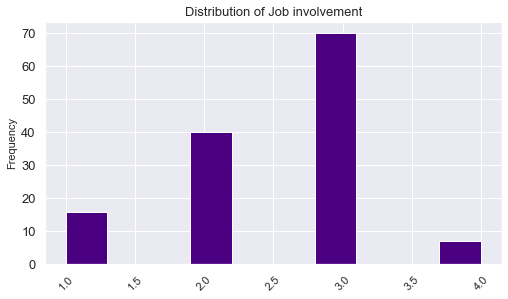

In [73]:
distribution(departed, 'job_involvement')

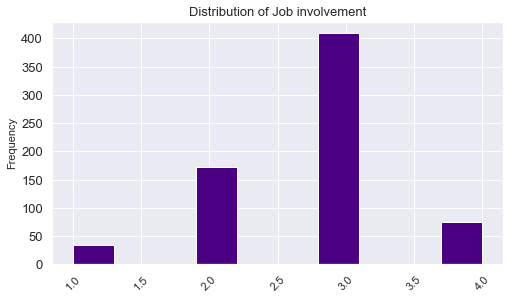

In [74]:
distribution(retained, 'job_involvement')

#### Takeaway
Moving on.

### FE Q IV
Do departed employees have lower job levels?

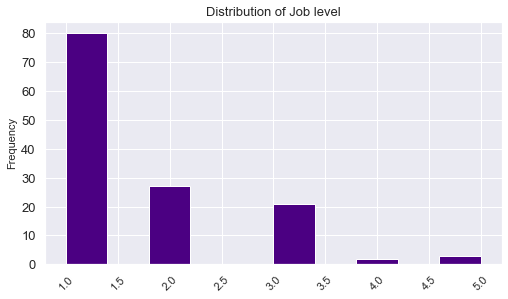

In [75]:
distribution(departed, 'job_level')

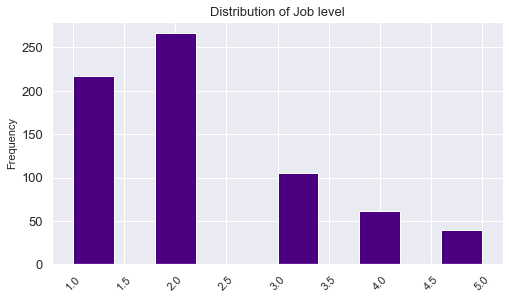

In [76]:
distribution(retained, 'job_level')

Hmmmmmmmm

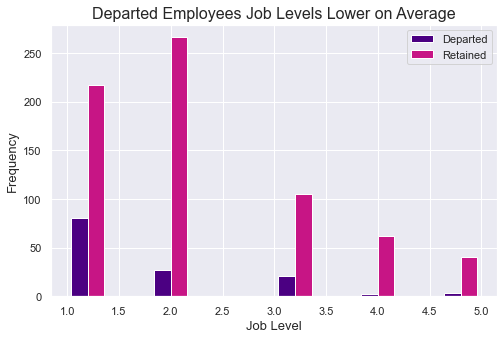

In [77]:
#create figure
plt.figure(figsize = (8, 5))

#plot distributions side by side
plt.hist([departed.job_level, retained.job_level],
        label = ['Departed', 'Retained'],
        color = ['indigo', 'mediumvioletred']
        )

#include legend
plt.legend()

#title
plt.title('Departed Employees Job Levels Lower on Average', size = 16, pad = 6)

#x-axis label
plt.xlabel('Job Level', size = 13)

#y-axis label
plt.ylabel('Frequency', size = 13);

### Takeaway
Looks like on average the job levels are lower for departed employees. Let's go ahead and run some tests to be sure.

Assumptions for T-Test:
* X Normality - an abdunance of observations means this assumption is met (central limit theorem).
* Independent observations - I think job levels for departed employees are independent of job levels for retained employees.
* Equal variances - will test for equal variances

In [78]:
#variances at a glance
departed.job_level.var(), retained.job_level.var()

(0.9097744360902261, 1.3131318230579987)

These definitely seem to vary enough to warrant a heteroscedasticity claim. Let's confirm.

In [79]:
#run levene's
stat, p = stats.levene(departed.job_level, retained.job_level)
stat, p

(4.314340491353123, 0.038102839073208626)

The low p-value suggests I can reject the null hypothesis of homoscedasticity. Let's run a t-test.

#### Null hypothesis: Departed employees have on average similar or greater  job levels to retained employees.
#### Alternate hypothesis: Departed employees have lower job levels than retained employees.

In [80]:
#run t-test
t_stat, p = stats.ttest_ind(departed.job_level, retained.job_level, equal_var = False, alternative = 'less')
t_stat, p

(-5.744712774174404, 1.5807061106939342e-08)

#### The negative t-statistic and the extremely low p-value allow me to confidently reject the null hypothesis that departed employees have similar or greater job levels than retained employees.

### Takeaway
* Departed employees on average have lower job levels than retained employees

### FE Q V
Do departed employees have lower monthly income on average?

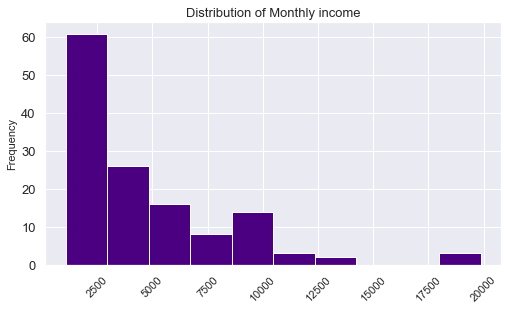

In [81]:
distribution(departed, 'monthly_income')

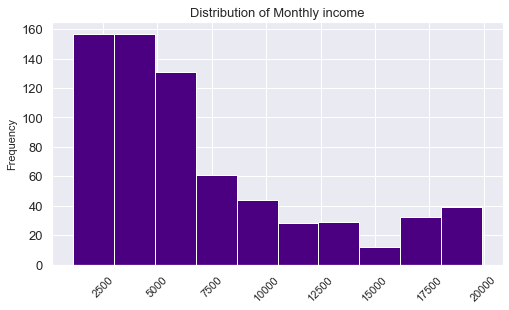

In [82]:
distribution(retained, 'monthly_income')

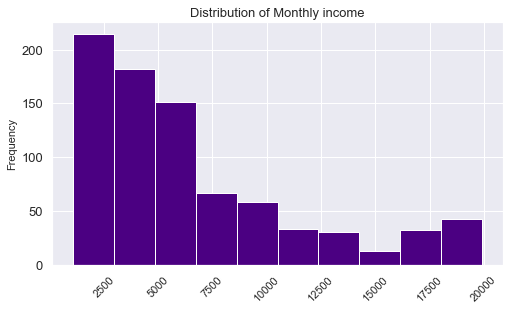

In [83]:
distribution(train, 'monthly_income')

In [84]:
from varname import nameof

def juxtapose_distributions(C1, C2, C3, feature):

    '''
    This function creates a figure and plots the histograms of the specified variable across 3 subset dataframes
    '''

    plt.figure(figsize = (8, 5))    # create figure

    f_string = feature.replace('_', ' ').capitalize()    # format pythonic-identifier feature name 
                                                         # as natural language string

    plt.hist([C1[feature], C2[feature], C3[feature]],      # plot histograms side-by-side
            label = [nameof(C1), nameof(C2), nameof(C3)],     # label each distribution
            color = ['indigo', 'mediumvioletred', 'hotpink']    # assign color to each distribution
            )

    plt.legend()    # show labels
    plt.title(f'Distribution of {f_string}', size = 16, pad = 6)    # title grid
    plt.xlabel(f_string, size = 13)      # label x-axis
    plt.ylabel('Frequency', size = 13);     # label y-axis

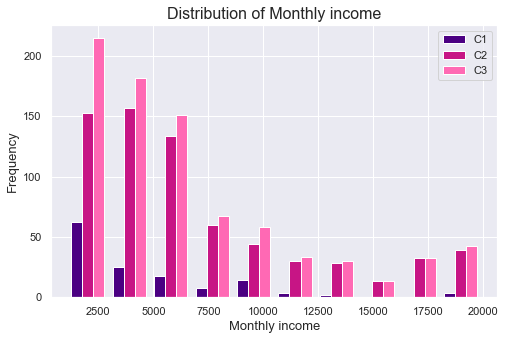

In [85]:
juxtapose_distributions(departed, retained, train, 'monthly_income')

Ugh installed varname for nothing

Distributions look around the same. Let's go ahead and run tests for clarity.

How does monthly income for departed employees compare against the overall mean?

How does monthly income for departed employees compare against retained employees?

Assumptions for one-sample t-test:
* X Normality - central limit theorem says it's ok.

#### Null hypothesis: Monthly income for departed employees is the same as or greater than the overall population mean.
#### Alternate hypothesis: Monthly income for departed employees is less than the overall population mean.

In [86]:
#run t-test
t_stat, p = stats.ttest_1samp(departed.monthly_income, train.monthly_income.mean(), alternative = 'less')
t_stat, p

(-5.565122408290438, 7.017468145117239e-08)

#### I can confidently reject the null hypothesis that monthly income for departed employees is the same as or greater than the overall population mean. Monthly income for departed employees is significantly less than the overall population mean.

#### Null hypothesis: Average monthly income for departed employees is the same as retained employees' monthly income.
#### Alternate hypothesis: Average monthly income for departed employees is less than retained employees' monthly income.

Assumptions for T-Test:
* X Normality - an abdunance of observations means this assumption is met (central limit theorem).
* Independent observations - is average monthly income of retained employees independent of monthly income for departed employees? I'm going to assume so for now.
* Equal variances - will test for equal variances

In [87]:
#variances at a glance
departed.monthly_income.var(), retained.monthly_income.var()

(13748977.582023242, 24437800.333247107)

If these variances aren't different, I don't know what is.

In [88]:
#run t-test
t_stat, p = stats.ttest_ind(departed.monthly_income, retained.monthly_income, equal_var = False)
t_stat, p

(-5.728636477285896, 3.1142821518566874e-08)

#### The negative t-statistic and extremely low p-value allow me to reject the null hypothesis that average monthly income is the same for departed and retained employees.

### Takeaways
* average monthly income for departed employees is significantly less than both the overall mean of monthly income and the average monthly income for retained employees.

### FE Q VI
Do departed employees generally own less stocks with the company?

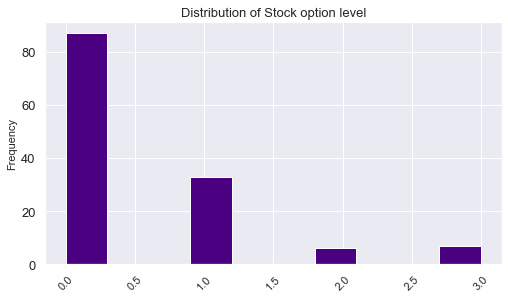

In [89]:
distribution(departed, 'stock_option_level')

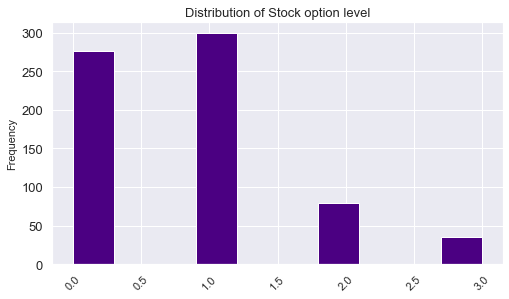

In [90]:
distribution(retained, 'stock_option_level')

Actually, it looks like the departed may have a lower average on stock option level. I want to clear the air.

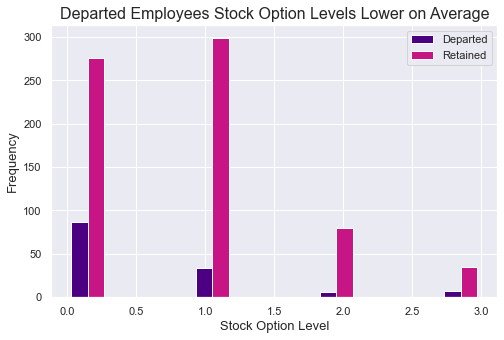

In [91]:
#create figure
plt.figure(figsize = (8, 5))

#plot distributions side by side
plt.hist([departed.stock_option_level, retained.stock_option_level],
        label = ['Departed', 'Retained'],
        color = ['indigo', 'mediumvioletred']
        )

#include legend
plt.legend()

#title
plt.title('Departed Employees Stock Option Levels Lower on Average', size = 16, pad = 6)

#x-axis label
plt.xlabel('Stock Option Level', size = 13)

#y-axis label
plt.ylabel('Frequency', size = 13);

It's still unclear for me. The distributions look more similar now...Let's go ahead and run some tests.

Assumptions for T-Test:
* X Normality - an abdunance of observations means this assumption is met (central limit theorem).
* X Independent observations - stock option level for departed employees is independent of retained employees' stock option levels
* Equal variances - will test for equal variances

In [92]:
#variances at a glance
departed.stock_option_level.var(), retained.stock_option_level.var()

(0.66097060833903, 0.6864895563829084)

Pretty sure these variances are the same. Right? Alright let's run a test.

In [93]:
#run levene's 
stat, p = stats.levene(departed.stock_option_level, retained.stock_option_level)
stat, p

(4.195861389099915, 0.04084030216266577)

Low p-value suggests these variances are different. I'm barely 95% confident of heteroscedasticity.

#### Null hypothesis: Stock option levels, on average, are the same for retained and departed employees.
#### Alternate hypothesis: Average stock option levels are not the same for retained and departed employees.

In [94]:
#run t-test with key word argument equal_var set to False
t_stat, p = stats.ttest_ind(departed.stock_option_level, retained.stock_option_level, equal_var = False)
t_stat, p

(-4.158317291022396, 4.8620482720330205e-05)

#### With a low p-value, I can confidently reject the null hypothesis that average stock option levels are the same for departed and retained employees. The negative t-statistic also allows me to see that average stock option levels for departed employees are lower than retained employees'.

### Takeaways
* departed employees own less stocks on average than retained employees

### FE Q VII
Is attrition associated with any level of travel?

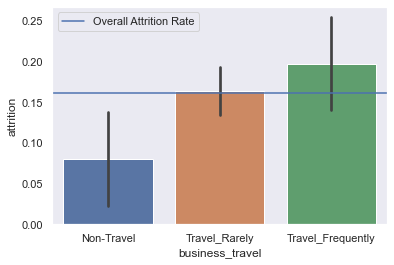

In [95]:
sns.barplot(x = 'business_travel', y = 'attrition', data = train)    # compare attrition across different levels of business travel
plt.axhline(train.attrition.mean(), label = 'Overall Attrition Rate')    # show overall attrition rate
plt.legend()    # label horizontal plot line
plt.grid(False);    # rid gridlines

#### Is attrition associated with level of travel?
#### Null hypothesis: Frequency of travel and attrition are independent of each other.
#### Alternate hypothesis: Travel frequency and attrition are associated.

In [96]:
#create contingency table of observed values
observed = pd.crosstab(train.attrition, train.business_travel)
observed

business_travel,Non-Travel,Travel_Frequently,Travel_Rarely
attrition,,,
0,80,126,484
1,7,31,95


In [97]:
#run chi2 test
explore.return_chi2(observed)

Observed
--------
[[ 80 126 484]
 [  7  31  95]]
Expected
--------
[[ 72 131 485]
 [ 14  25  93]]
Degrees of Freedom: 2
Chi^2 and P
-----------
chi^2 = 5.7432
p = 0.0566


#### Because the p-value is too high, I fail to reject the null hypothesis that traveling frequently and attrition are associated.

### Takeaway
* Attrition is not associated with any level of travel

### FE Q VIII
Is attrition asssociated with any education field?

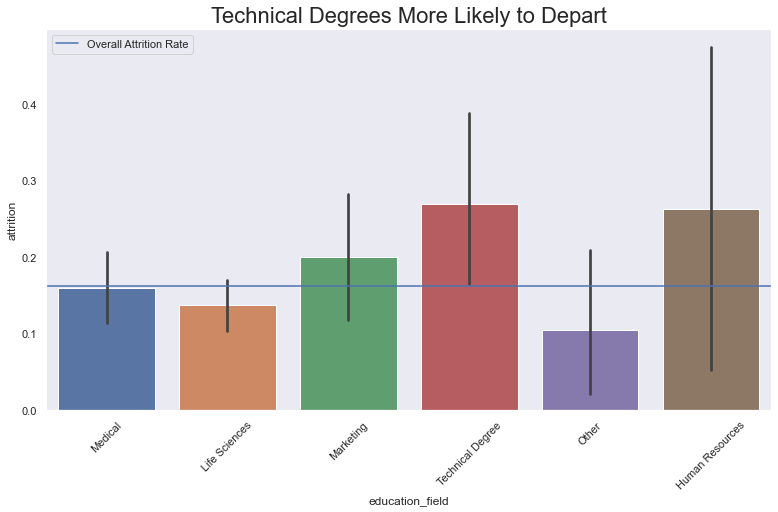

In [98]:
plt.figure(figsize = (13, 7))    # create figure
sns.barplot(x = 'education_field', y = 'attrition', data = train)    # compare attrition rates across education fields
plt.axhline(train.attrition.mean(), label = 'Overall Attrition Rate')    # show overall attrition rate
plt.legend()    # label horizontal plot line
plt.grid(False)    # good-bye, gridlines
plt.xticks(rotation = 45);    # rotate x-axis label ticks 45 degrees
plt.title('Technical Degrees More Likely to Depart', size = 22, pad = 7);

It looks like marketing eds, technical degrees, and human resources educations are above the overall attrition rate.

#### Null hypothesis: Attrition is independent of education field.
#### Alternate hypothesis: Atrrition is associated with an employee's education field.

In [99]:
#form a contingency table of observed values from pandas .crosstab function
observed = pd.crosstab(train.attrition, train.education_field)
observed

education_field,Human Resources,Life Sciences,Marketing,Medical,Other,Technical Degree
attrition,,,,,,
0,14,316,68,200,43,49
1,5,50,17,38,5,18


In [100]:
explore.return_chi2(observed)

Observed
--------
[[ 14 316  68 200  43  49]
 [  5  50  17  38   5  18]]
Expected
--------
[[ 15 306  71 199  40  56]
 [  3  59  13  38   7  10]]
Degrees of Freedom: 5
Chi^2 and P
-----------
chi^2 = 10.9010
p = 0.0534


One of the expected values falls under 5. I move forward with the understanding that this renders the results of a chi squared test invalid. Also, this is not a 2x2 table, so I'm moving on from this specific question.

What about between having a technical degree and attrition?

#### Null hypothesis: Attrition is independent of having a technical degree.
#### Alternate hyopthesis: There is a relationship between having a technical degree and attrition.

In [101]:
#form contingency table for observed values
observed = pd.crosstab(train.attrition, train.tech_deg_ed)
observed

tech_deg_ed,0,1
attrition,,
0,641,49
1,115,18


In [102]:
#run chi squared test
explore.return_chi2(observed)

Observed
--------
[[641  49]
 [115  18]]
Expected
--------
[[633  56]
 [122  10]]
Degrees of Freedom: 1
Chi^2 and P
-----------
chi^2 = 5.3393
p = 0.0208


#### With the low p-value, I can confidently reject the null hypothesis that attrition is independent of having a technical degree.

Is there a relationship between having an education in human resources and attrition? Between marketing and attrition?

#### Null hypothesis: There is no relationship between having an education in human resources and attrition.
#### Alternate hypothesis: Attrition and having an education in human resources are associated.

In [103]:
#form contingency table
observed = pd.crosstab(train.attrition, train.hr_ed)
observed

hr_ed,0,1
attrition,,
0,676,14
1,128,5


In [104]:
explore.return_chi2(observed)

Observed
--------
[[676  14]
 [128   5]]
Expected
--------
[[674  15]
 [129   3]]
Degrees of Freedom: 1
Chi^2 and P
-----------
chi^2 = 0.8126
p = 0.3674


One of the expected values is under 5. I move forward with the understanding that this renders the results of my chi squared test invalid. Perhaps a fisher exact test will allow me to see what I want to see in the data. Laugh out loud.

#### Null hypothesis: Attrition and having an education in human resources are independent.
#### Alternate hypothesis: Attrition and having an education in human resources are not independent of each other.

In [105]:
#form contingency table
observed = pd.crosstab(train.attrition, train.hr_ed)
observed

hr_ed,0,1
attrition,,
0,676,14
1,128,5


In [106]:
#calculate odds ratio and p-value
oddsr, p = stats.fisher_exact(observed)
oddsr, p

(1.8861607142857142, 0.21298741828870685)

#### With such a high p-value, I fail to reject the null hypothesis that attrition is independent of having an education in human resources.

Marketing?
#### Null hypothesis: There is no relationship between having an education in marketing and attrition.
#### Alternate hypothesis: Attrition and having an education in marketing are associated.

In [107]:
#form contingency table
observed = pd.crosstab(train.attrition, train.marketing_ed)
observed

marketing_ed,0,1
attrition,,
0,622,68
1,116,17


In [108]:
explore.return_chi2(observed)

Observed
--------
[[622  68]
 [116  17]]
Expected
--------
[[618  71]
 [119  13]]
Degrees of Freedom: 1
Chi^2 and P
-----------
chi^2 = 0.7396
p = 0.3898


#### With such a high p-value, I fail to reject the null hypothesis that there is no relationship between attrition and having an education in marketing.

### Takeaways
* Having a technical degree and attrition are associated
* Attrition is independent of having an education in human resources
* Attrition is independent of having an education in marketing

### FE Q IX
Is there a relationship between gender and attrition?

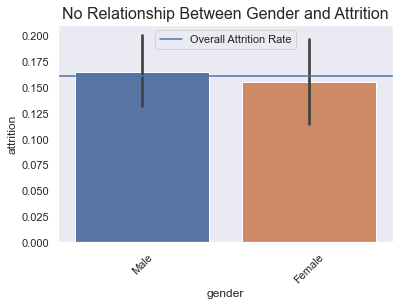

In [109]:
sns.barplot(x = 'gender', y = 'attrition', data = train)    # compare attrition rates across gender
plt.axhline(train.attrition.mean(), label = 'Overall Attrition Rate')    # show overall attrition rate
plt.legend()    # label horizontal plot line
plt.grid(False)    # good-bye, gridlines
plt.xticks(rotation = 45);    # rotate x-axis label ticks 45 degrees
plt.title('No Relationship Between Gender and Attrition', size = 16);    # title

### Takeaway
* It doesn't look like there is any relationship here.

### FE Q X
Is there any job where attrition occurs the most?

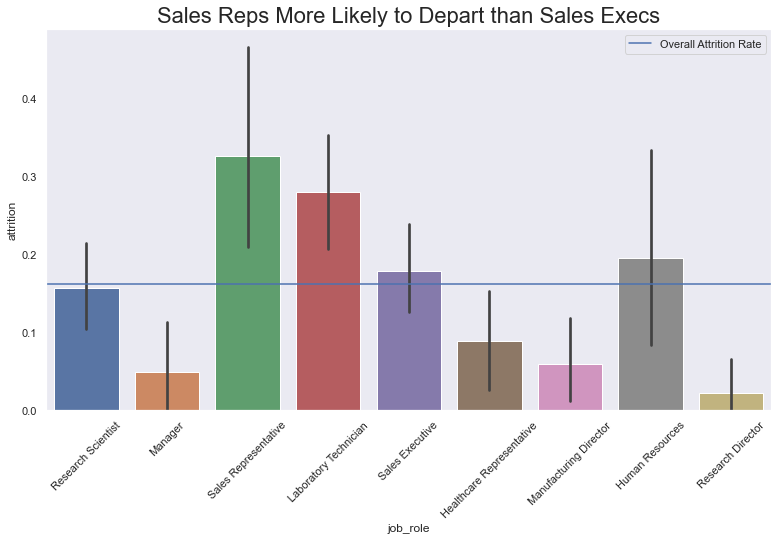

In [110]:
plt.figure(figsize = (13, 7))    # create figure
sns.barplot(x = 'job_role', y = 'attrition', data = train)    # compare attrition rates across different jobs
plt.axhline(train.attrition.mean(), label = 'Overall Attrition Rate')    # show overall attrition
plt.legend()    # label horizontal plot line
plt.grid(False)    # good-bye, gridlines
plt.xticks(rotation = 45);    # rotate x-axis label ticks 45 degrees
plt.title('Sales Reps More Likely to Depart than Sales Execs', size = 22, pad = 7);    # title

Is there a relationship between job role and attrition?

#### Null hypothesis: Job role and attrition are independent of each other.
#### Alternate hypothesis: Job role and attrition are not independent of each other.

In [111]:
#form contingency table of observed values
observed = pd.crosstab(train.attrition, train.job_role)
observed

job_role,Healthcare Representative,Human Resources,Laboratory Technician,Manager,Manufacturing Director,Research Director,Research Scientist,Sales Executive,Sales Representative
attrition,,,,,,,,,
0,72,29,108,59,80,45,130,138,29
1,7,7,42,3,5,1,24,30,14


In [112]:
explore.return_chi2(observed)

Observed
--------
[[ 72  29 108  59  80  45 130 138  29]
 [  7   7  42   3   5   1  24  30  14]]
Expected
--------
[[ 66  30 125  51  71  38 129 140  36]
 [ 12   5  24  10  13   7  24  27   6]]
Degrees of Freedom: 8
Chi^2 and P
-----------
chi^2 = 46.9754
p = 0.0000


#### I reject the null hypothesis that job role and attrition are independent of each other.

Is there a relationship between sales reps and attrition?

#### Null hypothesis: Working as a sales rep and attrition are independent of each other.
#### Alternate hypothesis: There is an association between attrition and working as a sales representative.

In [113]:
#form contingency table of observed values
observed = pd.crosstab(train.attrition, train.sales_rep_job)
observed

sales_rep_job,0,1
attrition,,
0,661,29
1,119,14


In [114]:
#run test
explore.return_chi2(observed)

Observed
--------
[[661  29]
 [119  14]]
Expected
--------
[[653  36]
 [126   6]]
Degrees of Freedom: 1
Chi^2 and P
-----------
chi^2 = 7.7724
p = 0.0053


#### With such a low p-value, I can confidently reject the null hypothesis that working as a sales representative and attrition are independent.

Is there a relationship between attrition and lab techs?

#### Null hypothesis: Attrition and working as a lab tech are independent.
#### Alternate hypothesis: Working as a laboratory technician and attrition are associated.

In [115]:
#form contingency
observed = pd.crosstab(train.attrition, train.lab_tech_job)
observed

lab_tech_job,0,1
attrition,,
0,582,108
1,91,42


In [116]:
#run test
explore.return_chi2(observed)

Observed
--------
[[582 108]
 [ 91  42]]
Expected
--------
[[564 125]
 [108  24]]
Degrees of Freedom: 1
Chi^2 and P
-----------
chi^2 = 17.9244
p = 0.0000


#### I'm very confident in rejecting the null hypothesis that attrition and working as a laboratory technician are independent.

Is there a relationship between working as a sales exec and attrition?
#### Null hypothesis: Attrition and working as a sales exec are independent.
#### Alternate hypothesis: Working as a sales executive and attrition are associated.

In [117]:
#form contingency
observed = pd.crosstab(train.attrition, train.sales_exec_job)
observed

sales_exec_job,0,1
attrition,,
0,552,138
1,103,30


In [118]:
explore.return_chi2(observed)

Observed
--------
[[552 138]
 [103  30]]
Expected
--------
[[549 140]
 [105  27]]
Degrees of Freedom: 1
Chi^2 and P
-----------
chi^2 = 0.3050
p = 0.5808


#### With such a high p-value, I fail to reject the null hypothesis that attrition is independent of working as a sales executive.

Is there a relationship between attrition and working as an hr employee?
#### Null hypothesis: Attrition and working as an human resources employee are independent of each other.
#### Alternate hypothesis: There is a relationship between working as human resources employee and attrition.

In [119]:
#form table
observed = pd.crosstab(train.attrition, train.hr_job)
observed

hr_job,0,1
attrition,,
0,661,29
1,126,7


In [120]:
explore.return_chi2(observed)

Observed
--------
[[661  29]
 [126   7]]
Expected
--------
[[659  30]
 [127   5]]
Degrees of Freedom: 1
Chi^2 and P
-----------
chi^2 = 0.0998
p = 0.7521


Expected values too small.

In [121]:
#run fisher's exact test
odds_r, p = stats.fisher_exact(observed)
odds_r, p

(1.2662835249042146, 0.641733551315919)

Ok yep, this pretty much validates what I explored earlier. Nothing to see here.

### Takeaways
* Attrition and working as a sales rep are related
* Attrition and working as a lab tech are associated
* Attrition is independent of working as a sales exec
* Attrition is independent of working as a human resources employee

### FE Q XI
Are marital status and attrition independent of each other?

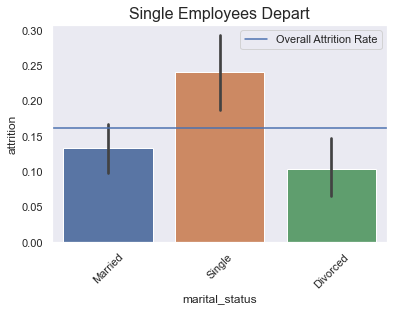

In [122]:
sns.barplot(x = 'marital_status', y = 'attrition', data = train)    # compare attrition rates across marital status
plt.axhline(train.attrition.mean(), label = 'Overall Attrition Rate')    # show overall attrition rate
plt.legend()    # label horizontal plot line
plt.grid(False)    # good-bye, gridlines
plt.xticks(rotation = 45);    # rotate x-axis label ticks 45 degrees
plt.title('Single Employees Depart', size = 16);    # title

In [123]:
#form contingency table
observed = pd.crosstab(train.attrition, train.marital_status)
observed

marital_status,Divorced,Married,Single
attrition,,,
0,163,325,202
1,19,50,64


#### Null hypothesis: Attrition and marital status are independent of each other.
#### Alternate hypothesis: Attrition and marital status are not independent of each other.

In [124]:
#run test
explore.return_chi2(observed)

Observed
--------
[[163 325 202]
 [ 19  50  64]]
Expected
--------
[[152 314 223]
 [ 29  60  42]]
Degrees of Freedom: 2
Chi^2 and P
-----------
chi^2 = 18.8604
p = 0.0001


#### With such a low p-value, I can confidently reject the null hypothesis that attrition and marital status are independent of each other.

Is being single associated with attrition?

#### Null hypothesis: Attrition is independent of being a single employee.
#### Alternate hypothesis: Reporting single on an employee survey and departing the company are not independent of each other.

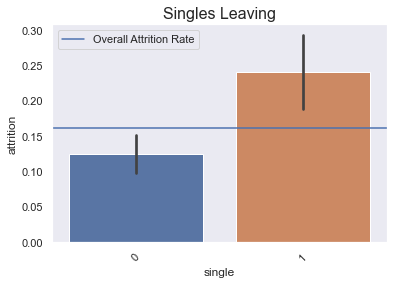

In [125]:
sns.barplot(x = 'single', y = 'attrition', data = train)    # compare attrition rates across marital status
plt.axhline(train.attrition.mean(), label = 'Overall Attrition Rate')    # show overall attrition rate
plt.legend()    # label horizontal plot line
plt.grid(False)    # good-bye, gridlines
plt.xticks(rotation = 45);    # rotate x-axis label ticks 45 degrees
plt.title('Singles Leaving', size = 16);    # title

Chart says yes.

In [126]:
observed = pd.crosstab(train.attrition, train.single)
observed

single,0,1
attrition,,
0,488,202
1,69,64


In [127]:
explore.return_chi2(observed)

Observed
--------
[[488 202]
 [ 69  64]]
Expected
--------
[[466 223]
 [ 90  42]]
Degrees of Freedom: 1
Chi^2 and P
-----------
chi^2 = 17.2519
p = 0.0000


#### I confidently reject the null hypothesis that attrition is independent of being a single employee at IBM.

Is there a relationship between being divorced and attrition? It looks as much below the overall attrition rate as being single is above the overall rate.
#### Null hypothesis: Attrition and being divorced are independent.
#### Alternate hypothesis: There is a relationship between attrition and being divorced.

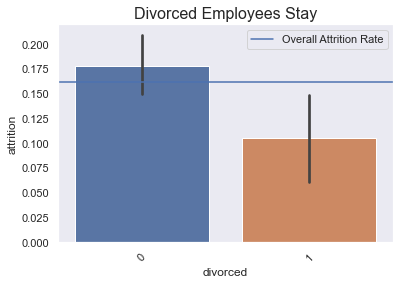

In [128]:
sns.barplot(x = 'divorced', y = 'attrition', data = train)    # compare attrition rates across marital status
plt.axhline(train.attrition.mean(), label = 'Overall Attrition Rate')    # show overall attrition rate
plt.legend()    # label horizontal plot line
plt.grid(False)    # good-bye, gridlines
plt.xticks(rotation = 45);    # rotate x-axis label ticks 45 degrees
plt.title('Divorced Employees Stay', size = 16);    # title

Chart says yes.

In [129]:
#observe values
observed = pd.crosstab(train.attrition, train.divorced)
observed

divorced,0,1
attrition,,
0,527,163
1,114,19


In [130]:
#run test
explore.return_chi2(observed)

Observed
--------
[[527 163]
 [114  19]]
Expected
--------
[[537 152]
 [103  29]]
Degrees of Freedom: 1
Chi^2 and P
-----------
chi^2 = 5.1155
p = 0.0237


#### With a low p-value, I confidently reject the null hypothesis that attrition and being divorced are independent of each other.

And being married and not divorced? Anything here?

#### Ho: Attrition and being married independent
#### Ha: Attrition and being married not independent

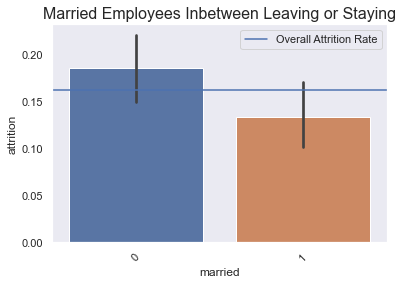

In [131]:
sns.barplot(x = 'married', y = 'attrition', data = train)    # compare attrition rates across marital status
plt.axhline(train.attrition.mean(), label = 'Overall Attrition Rate')    # show overall attrition rate
plt.legend()    # label horizontal plot line
plt.grid(False)    # good-bye, gridlines
plt.xticks(rotation = 45);    # rotate x-axis label ticks 45 degrees
plt.title('Married Employees Inbetween Leaving or Staying', size = 16);    # title

Chart says no.

In [132]:
#observe values
observed = pd.crosstab(train.attrition, train.married)
observed

married,0,1
attrition,,
0,365,325
1,83,50


In [133]:
#run chi squared test
explore.return_chi2(observed)

Observed
--------
[[365 325]
 [ 83  50]]
Expected
--------
[[375 314]
 [ 72  60]]
Degrees of Freedom: 1
Chi^2 and P
-----------
chi^2 = 3.6894
p = 0.0548


#### Chi squared test also say no to Ha.

### Takeaways
* Marital status and attrition are associated somehow
* Being single and attrition are associated
* Being divorced and attrition have a relationship
* There is no relationship between being married and attrition

### FE Q XII
Is attrition related to whether or not an employee has overtime?

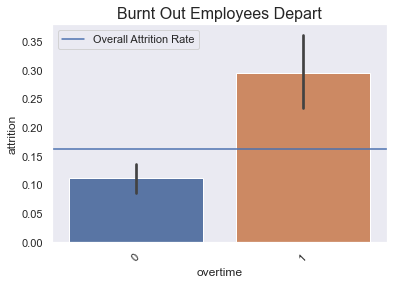

In [134]:
sns.barplot(x = 'overtime', y = 'attrition', data = train)    # compare attrition rates across overtime status
plt.axhline(train.attrition.mean(), label = 'Overall Attrition Rate')    # show overall attrition rate
plt.legend()    # label horizontal plot line
plt.grid(False)    # good-bye, gridlines
plt.xticks(rotation = 45);    # rotate x-axis label ticks 45 degrees
plt.title('Burnt Out Employees Depart', size = 16);    # title

The chart is pretty clear to me. Employees who have overtime leave the company more.

### FE Q XIII
Are departed employees younger or older on average than retained employees?

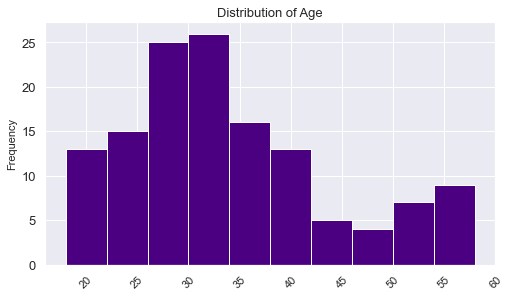

In [135]:
distribution(departed, 'age')

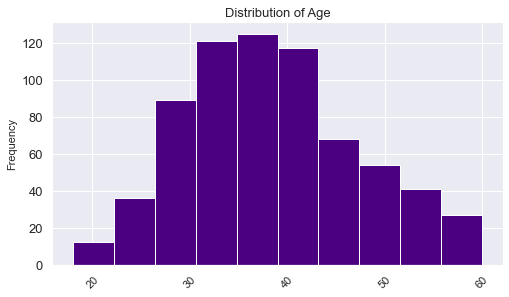

In [136]:
distribution(retained, 'age')

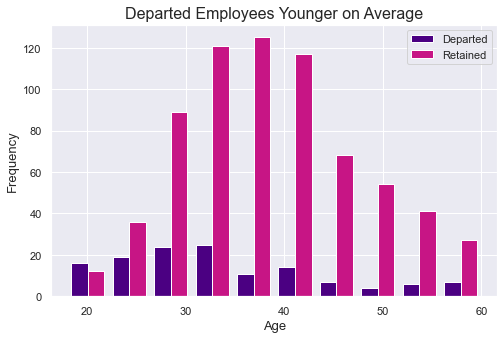

In [137]:
#create figure
plt.figure(figsize = (8, 5))

#plot distributions side by side
plt.hist([departed.age, retained.age],
        label = ['Departed', 'Retained'],
        color = ['indigo', 'mediumvioletred']
        )

#include legend
plt.legend()

#title
plt.title('Departed Employees Younger on Average', size = 16, pad = 6)

#x-axis label
plt.xlabel('Age', size = 13)

#y-axis label
plt.ylabel('Frequency', size = 13);

It looks like departed employees have a lower average age than retained employees.

Assumptions for T-Test:
* X Normality - an abdunance of observations means this assumption is met (central limit theorem).
* X Independent observations - age of one employee is not dependent on another employee's age.
* Equal variances - will check for equal variances

In [138]:
#variances at a glance
departed.age.var(), retained.age.var()

(105.16142629300523, 80.17403083654114)

Variances defintely seem different.

#### Null hypothesis: Departed and retained employees are around the same age.
#### Alternate hypothesis: Departed and retained employees average different years on Earth.

In [139]:
#run t-test
t_stat, p = stats.ttest_ind(departed.age, retained.age, equal_var = False)
t_stat, p

(-4.876644519850288, 2.432846117559299e-06)

#### I can confidently reject the null hypothesis that departed and retained employees are on average the same age.

### Takeaway:
* Departed employees are significantly younger than retained employees.

# Explore Summary:
### Univariate Stats:
#### Distributions Takeaways
First row:
* age is normally distributed
* daily rate is pretty uniformly distributed
* most people work close to home
* most employees have a bachelor's degree (close to 600) and then more have a master's (approx 400) than those with a 'college' education (around 300) and then a few hundred have 'below college' for education, and then around 50 have a doctorate
* around 300 people have low satsifaction with the environment, around 300 have medium satisfaction-- but around 500 people have high satisfaction and around 500 people have very high satisfaction with the environment

Second row:
* hourly rate seems uniformally distributed, with slight majority of employees (just shy of 200) having an hourly rate of 100
* Most employees are highly involved with their job
* Most employees are 1st and 2nd level jobs and around 200 employees have a third level job
* Around 300 employees each have low or medium satisfaction, but most people (around 500 each) have high or very high satisfaction
* majority of monthly incomes are 5000 or below


Third row:
* no surprise, monthly rate is also pretty uniformly distributed
* majority of employees have worked at one company, otherwise pretty uniformly distributed from 0-9
* salary hike percentage is skewed to the right, with most employees having relatively low percentage hike in salary
* most employees have performances rated at 'excellent,' but there are around 200 or so with a performance rating of 'outstanding.'
* around 500 or so each have high or very high satisfaction with their relationship, around 300 each have low and medium satisfaction


Fourth row:
* majority of employees own 0 or few stocks from company
* total working years hist is skewed to the right, with majority of employees having 5-10 years of work under their belt (xticks end at 40 for this chart)
* majority of employees trained 2-3 hours last year
* majority of employees rate their work life balance as 'better' (over 800) and around 400 rate it as 'good'
* majority of employees have been with the company for 10 or less years

Fifth row:
* majority of employees have 2-3 years in their current role, chart is heavily skewed to the right
* majority of employees have 0 years since their last promotion, chart is heavily skewed to the right (otherwise uniformly distributed aside from employees with 0-1 years since last promo)
* majority of employees have 2 years with the current manager, and those with 7 years and 0 have similar groupsizes, other than that the chart is pretty randomly distributed 


* majority of employees have an education in life sciences or in the medical field
* most employees stay with the company
* most employees travel rarely
* most employees work in R&D
* majority of employees are male
* slight majority of employees are married, a good proportion of employees are single and then a good proportion are divorced
* around 400 employees get overtime, majority do not


* boxplot distributions supplement my knowledge of feature distributions with medians and IQRs, and it looks like I have outliers in the data

Outliers present in:
* monthly income (lots of outliers here)
* number of companies worked at
* performance rating
* total working years
* years at the company
* years in current role
* years since last promotion
* years with current manager

I will leave the outliers be for now. There aren't very many outliers pressent except for in the monthly income distribution (ok there are lots of outliers), and I would like to include all data in my first models. I will use a robust scaler with high hopes.


### Bivariate Stats

* departed employees have significantly less job satisfaction than retained employees
* departed employees reported significantly less relationship satisfaction than retained employees
* Total working years for departed and retained employees are different. Total working years for departed employees are less on average.
* Retained employees work closer to home on average than departed employees.
* Departed employees on average have lower job levels than retained employees
* average monthly income for departed employees is significantly less than both the overall mean of monthly income and the average monthly income for retained employees.
* departed employees own less stocks on average than retained employees
* Having a technical degree and attrition are associated
* Attrition and working as a sales rep are related
* Attrition and working as a lab tech are associated
* Marital status and attrition are associated somehow
* Being single and attrition are associated
* Being divorced and attrition have a relationship
* Employees who have overtime leave the company more.
* Departed employees are significantly younger than retained employees.

### Not very effective
* Attrition is not associated with any department.
* Attrition is not associated with any level of travel
* Attrition is independent of having an education in human resources
* Attrition is independent of having an education in marketing
* no relationship between gender and attrition
* Attrition is independent of working as a sales exec
* Attrition is independent of working as a human resources employee
* There is no significant difference in performance between departed and retained employees.
* No significant differences in percent salary hike
* No significant differences in years since last promotion
* daily rates for departed and retained employees on average are the same


### Attrition-Hue Takeaways
* It seems the farther from home, the more likely for employee attrition to occur
* Employees with lower percent salary hikes seem to depart the company more (iffy)
* Seems like employees with more years since their last promotion depart the company more
* Seems like the less involved an employee is with their job, the more likely attrition is to come swinging around
* Similar observation with job level (the lower the job level etc.)
* The lower the monthly income, the higher the chance of attrition
* May be a relationship between stocks owned and attrition (the lower the stock option level, the higher chance of attrition it seems)
* The less time spent with the company, the higher the chance of attrition

Doesn't seem to affect attrition:
* age doesn't seem to affect attrition
* daily rate (pay) doesn't seem to affect attrition
* education doesn't seem to affect attrition
* neither does employee satisfaction with the environment
* hourly rate
* job satisfaction
* ironically, monthly rate doesn't seem to affect attrition, but monthly income does? hmm. There are many outliers in monthly income, but not for monthly rate. Perhaps that has something to do with it.
* companies worked
* performance rating
* relationship satisfaction iffy
* total working years
* hours trained in the previous year
* work life balance
* number of years an employee has been with the company
* years with manager

## Moving forward
* I will try models with all of the features and I will try models with just the most important variables discovered in EDA
* I will move forward with features that have a relationship to the target variable in mind
    * job satisfaction
    * relationship satisfaction
    * total working years
    * distance from home
    * job level
    * monthly income
    * stock option level
    * technical degree education
    * sales rep job
    * lab tech job
    * marital status
        * being single
        * being divorced
    * overtime
    * age